### Imports

In [1]:
from google.colab import drive
import json
import numpy as np
import pandas as pd
from PIL import Image
import tensorflow as tf
import sklearn
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix
from transformers import AlbertTokenizer, AlbertConfig, TFAlbertModel
from transformers import AlbertTokenizerFast as ATF
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from collections import Counter
import pickle
import shutil
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning,
                        module="transformers.generation.tf_utils")
from IPython.display import display, HTML

### Files

I discovered that it is important to keep the images in separate dataset folders as the id numbers are reused across datasets but not within any particular dataset, therefore they will be kept separate, as will the BIO tag csv files as they are also named according to their IDs.

In [2]:
#mount my google drive
drive.mount('/content/drive')
#create the data and image folders
!mkdir data
!mkdir data/images
!mkdir data/images/training
!mkdir data/images/val
!mkdir data/images/test
#copy images into image folder
!cp /content/drive/'My Drive'/DeepLearningAss2/datasets/EnhancedTask/dev_images/* ./data/images/val
!cp /content/drive/'My Drive'/DeepLearningAss2/datasets/EnhancedTask/test_images/* ./data/images/test
!cp /content/drive/'My Drive'/DeepLearningAss2/datasets/EnhancedTask/training_images/* ./data/images/training
!cp /content/drive/'My Drive'/DeepLearningAss2/datasets/EnhancedTask/*.txt ./data

Mounted at /content/drive


During data exploration it was discovered that there was a duplicated meme between the training and test sets, which was included in both the dataset counts. The choice to move the image to the training set is based on a) the meme has no labels so will have minimal impact on training/testing either way and b) 688 training images is divisible by 8 which makes it a good dataset size, allowing no images to be skipped in each training epoch

In [3]:
#move 474_image_batch_2.png to training set
!mv ./data/images/test/474_image_batch_2.png ./data/images/training/474_image_batch_2.png

In [4]:
#Meme image and id names are equivalent after this edit

# Paths to the image folders
image_folders = ['./data/images/training/', './data/images/test/', './data/images/val/']

# Loop through both folders and rename files
for folder in image_folders:
    for filename in os.listdir(folder):
        new_filename = filename.replace('_image', '')
        os.rename(os.path.join(folder, filename), os.path.join(folder, new_filename))

### Load data

Importantly this includes resizing the images to 224x224 - reason being that this is the size of images which ResNet was pretrained on. Images will later be viewed in their original form during data exploration.

In [5]:
#file directories
train_dir = "./data/training_labels.txt"
val_dir = "./data/dev_labels.txt"
test_dir = "./data/test_labels.txt"
persuasions_dir = "./data/persuasion_techniques.txt"

#load techniques
def load_techniques():
    with open(persuasions_dir, 'r') as file:
        techniques = [line.strip() for line in file.readlines() if len(line.strip()) > 0]
    return techniques

techniques = load_techniques()

#load data
def load_data(dir, dataset):
    with open(dir, 'r', encoding='utf8') as file:
        data = json.load(file)

    #initiate lists for data columns
    id, text, label_detail_lists, images = [], [], [], []

    for i, observation in enumerate(data):
        id.append(observation['id'])
        text.append(observation['text'])
        label_detail_lists.append([])

        labels = observation['labels']
        for label in labels:
            label_detail_lists[i].append([label['start'], label['end'], label['technique'], label['text_fragment']])

        image_link = observation['id']
        images.append("./data/images/" + dataset + image_link + ".png")
    return id, text, label_detail_lists, images

training_ids, training_texts, training_label_detail_lists, training_images_link  = load_data(train_dir, "training/")
val_ids, val_texts, val_label_detail_lists, val_images_link = load_data(val_dir, "val/")
test_ids, test_texts, test_label_detail_lists, test_images_link = load_data(test_dir, "test/")

#load images
def load_images(image_list):
    images = []
    for image in image_list:
        # Open the image
        try:
          img = Image.open(image)     #image is a regex string
          # Resize the image to 224x224
          img = img.resize((224, 224))
          # Convert image to NumPy array and normalize
          img = np.array(img) / 255.0
          # add to list of images
          images.append(img)
        except:
          #in the case of the moved test image, the image is not there
          print(f"{image} not present")

    return images

training_images = np.asarray(load_images(training_images_link))
val_images = np.asarray(load_images(val_images_link))
test_images = np.asarray(load_images(test_images_link))

./data/images/test/474_batch_2.png not present


In [6]:
print(f"Length of training ids: {len(training_ids)} == length of training images: {training_images.shape[0]}")
print(f"Length of val ids: {len(val_ids)} == length of val images: {val_images.shape[0]}")
print(f"Length of test ids: {len(test_ids)} == length of test images: {test_images.shape[0]}")

Length of training ids: 688 == length of training images: 688
Length of val ids: 63 == length of val images: 63
Length of test ids: 200 == length of test images: 199


Due to the duplicate image between the test and training sets being moved to the training set, the test image labels contains an extra label, the id and image link for which was output above. Also the validation set contains 63 images, which will not work nicely with our batch size of 8, so I will move one image from the test set to the validation set so that all images are being used during each epoch when the model is tested against the validation memes.

In [7]:
#get index of missing test image
index_of_missing_test_image = test_images_link.index("./data/images/test/474_batch_2.png")

We will remove the labels for the missing test image and move one meme from test to validation.

In [8]:
# Move the last test image and corresponding info to the validation set
def move_last_test_to_val():
    # Pop the last image and corresponding info from the test set
    last_test_id = test_ids.pop(-1)
    last_test_text = test_texts.pop(-1)
    last_test_label_details = test_label_detail_lists.pop(-1)
    last_test_image_link = test_images_link.pop(-1)

    # Append the popped values to the validation set
    val_ids.append(last_test_id)
    val_texts.append(last_test_text)
    val_label_detail_lists.append(last_test_label_details)
    val_images_link.append(last_test_image_link)

# Remove the missing test image and its corresponding data
def remove_missing_test_image(index_of_missing_test_image):
    # Remove the corresponding data from all lists
    test_ids.pop(index_of_missing_test_image)
    test_texts.pop(index_of_missing_test_image)
    test_label_detail_lists.pop(index_of_missing_test_image)
    test_images_link.pop(index_of_missing_test_image)

# Perform the move and removal
move_last_test_to_val()
remove_missing_test_image(index_of_missing_test_image)

# Reload the images with updated lists
val_images = np.asarray(load_images(val_images_link))
test_images = np.asarray(load_images(test_images_link))

# Print the updated lengths to confirm
print(f"Updated length of val ids: {len(val_ids)} == length of val images: {val_images.shape[0]}")
print(f"Updated length of test ids: {len(test_ids)} == length of test images: {test_images.shape[0]}")

Updated length of val ids: 64 == length of val images: 64
Updated length of test ids: 198 == length of test images: 198


These are all the labels which would have been skipped during validation if we used a batch size of 8 and validation set of 63 images. It would be possible to adjust the batch size for validation, but this is considered an easier and reasonable option.

In [9]:
val_label_detail_lists[56:64]

[[[0,
   54,
   'Smears',
   'ANTIFA\n\n"A courageous group of Americans."\n- Joe Biden'],
  [11, 40, 'Name calling/Labeling', 'courageous group of Americans']],
 [[0, 12, 'Slogans', 'LIVES MATTER'],
  [14,
   73,
   'Reductio ad hitlerum',
   "If you need a color in front of those words you're a racist"],
  [67, 73, 'Name calling/Labeling', 'racist']],
 [[42, 76, 'Loaded Language', 'violence,\nrioting, looting & arson'],
  [0,
   120,
   'Doubt',
   'Has anyone heard these two condemning the violence,\nrioting, looting & arson that has been taking place across the U.S.?'],
  [0,
   130,
   'Smears',
   "Has anyone heard these two condemning the violence,\nrioting, looting & arson that has been taking place across the U.S.?\nI haven't"]],
 [[10, 17, 'Loaded Language', 'Fu*king'],
  [59, 72, 'Name calling/Labeling', 'Mentally Sick'],
  [59, 72, 'Loaded Language', 'Mentally Sick'],
  [81, 90, 'Loaded Language', 'Truly ill'],
  [40,
   184,
   'Smears',
   'President Trump is Mentally Sic

Note that the meme which was moved has no labels, so again, moving this meme will have (some but) minimal impact on the evaluation of a model on test data.

### Text Preprocessing

Now I need to generate BIO tags for each technique for each meme in the training, development/validation and test datasets as they will be needed for comparing model predictions against the labels.

In [10]:
#function for updating BIO labels using token offsets
def update_BIO_label(full_text, text_fragment, start, end,
                     technique, BIO_label, offset_mapping):
    start_char = start
    end_char = end

    #initial boolean for whether start of the text fragment has been labelled
    found_b = False
    for i, (start_o, end_o) in enumerate(offset_mapping):
        # Special tokens
        if start_o == end_o:
            continue
        #token from text fragment
        if start_char <= start_o < end_char:
            #first token in text fragment
            if not found_b:
                BIO_label[i] = f'I-{technique}' #changed to I so 41 categories become 21
                found_b = True
            #other tokens in text fragment
            else:
                BIO_label[i] = f'I-{technique}'
        #not token from text fragment
        elif start >= end_char:
            break

    return BIO_label

In [ ]:
# !rm -r BIO_CSVs #uncomment if CSVs have already been generated

In [11]:
#create folder for BIO_label data frame csv files
!mkdir BIO_CSVs
!mkdir BIO_CSVs/training
!mkdir BIO_CSVs/val
!mkdir BIO_CSVs/test

We need the max token lengths of all texts, including and excluding special tokens, as I use the one including special tokens for the max_length for token padding, and the one excluding special tokens for the length of blank BIO labels.

In [12]:
#function to tokenize a batch of text inputs
def tokenize_text(texts, tokenizer, max_length):
    return tokenizer(
        texts,
        padding='max_length',
        truncation=True,
        max_length=max_length,
        verbose=0
    )

def count_non_special_tokens(encoded_text, tokenizer):
    return sum(1 for token in encoded_text if token not in tokenizer.all_special_ids)

#prep text and tokenizer to check for max token length
all_text = training_texts + val_texts + test_texts
tokenizer = ATF.from_pretrained('albert-base-v2')

# Calculate token length distribution including special tokens
text_token_lengths_with_special = [len(tokenizer.encode(text)) for text in all_text]

# Calculate token length distribution in all_text, excluding special tokens
text_token_lengths = [count_non_special_tokens(tokenizer.encode(text), tokenizer) for text in all_text]

max_length_with_special = max(text_token_lengths_with_special)
max_length = max(text_token_lengths)

#print them
print(f"maximum token length amungst meme text including special tokens: {max_length_with_special}")
print(f"maximum token length amungst meme text: {max_length}")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/760k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.31M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/684 [00:00<?, ?B/s]

maximum token length amungst meme text including special tokens: 101
maximum token length amungst meme text: 99


In [13]:
#function to generate BIO CSVs from label detail lists
def generate_BIO_CSVs(ids, texts, label_detail_lists, dataset, techniques=techniques):
    #load tokenizer
    tokenizer = ATF.from_pretrained('albert-base-v2')
    #for each meme
    for i in range(len(ids)):
        #save full text
        full_text = texts[i]

        #tokenize the text and extract tokens and offset mappings
        tokenized = tokenizer(full_text, padding='max_length',
                              max_length=max_length_with_special,
                              truncation=True, return_offsets_mapping=True)
        tokens = tokenizer.convert_ids_to_tokens(tokenized['input_ids'])
        offset_mapping = tokenized['offset_mapping']

        # Filter out special tokens and their corresponding offset mappings
        valid_tokens = []
        valid_offset_mapping = []
        for token, offset in zip(tokens, offset_mapping):
            if token not in ['[CLS]', '[SEP]', '[PAD]']:
                valid_tokens.append(token)
                valid_offset_mapping.append(offset)

        #initiate dataset and creat column of tokens
        df = pd.DataFrame()
        df['token'] = valid_tokens

        #for each technique
        for technique in techniques:
            #generate a blank BIO label
            BIO_label = ['O'] * max_length

            #for each label for this meme
            for label_detail in label_detail_lists[i]:
                #if the label is for the current technique
                if technique == label_detail[2]:
                    #save the start, end and text fragment
                    start = label_detail[0]
                    end = label_detail[1]
                    text_fragment = label_detail[3]
                    #update the BIO label to reflect this label
                    BIO_label = update_BIO_label(full_text, text_fragment,
                                                 start, end, technique,
                                                 BIO_label, valid_offset_mapping)
            #save the finished BIO label as a column under the current technique
            df[technique] = BIO_label

        #write the BIO CSV to file
        path = f'./BIO_CSVs/{dataset}{ids[i]}.csv'
        df.to_csv(path, index=False, encoding='utf-8')

#generate BIO labels for all the memes
generate_BIO_CSVs(training_ids, training_texts, training_label_detail_lists, "training/")
generate_BIO_CSVs(val_ids, val_texts, val_label_detail_lists, "val/")
generate_BIO_CSVs(test_ids, test_texts, test_label_detail_lists, "test/")

In [14]:
#function to load the BIO labels back from the CSV files
def load_BIO_data(path, techniques):
    #read the BIO label csv from file into a data frame
    df = pd.read_csv(path, header=0)
    #extract the token column as a list
    full_text_tokens = list(df['token'])
    #initialize an empty list for labels
    labels = []
    #initiate empty list for label counts
    label_counts = Counter()
    #for each technique, append the list of labels for that technique
    for technique in techniques:
        technique_labels = list(df[technique])
        labels.append(technique_labels)
    #return the list of words and the list of lists of BIO tags
    return full_text_tokens, labels

In [15]:
#get list of lists of BIO tags for each dataset for constructing labels
train_full_text_token_lists, train_BIO_tag_list_lists = [], []
for id in training_ids:
    train_full_text_tokens, train_tag_lists = load_BIO_data('./BIO_CSVs/training/'+str(id)+'.csv', techniques)
    train_full_text_token_lists.append(train_full_text_tokens)
    train_BIO_tag_list_lists.append(train_tag_lists)

val_full_text_token_lists, val_BIO_tag_list_lists = [], []
for id in val_ids:
    val_full_text_tokens, val_tag_lists = load_BIO_data('./BIO_CSVs/val/'+str(id)+'.csv', techniques)
    val_full_text_token_lists.append(val_full_text_tokens)
    val_BIO_tag_list_lists.append(val_tag_lists)

test_full_text_token_lists, test_BIO_tag_list_lists = [], []
for id in test_ids:
    test_full_text_tokens, test_tag_lists = load_BIO_data('./BIO_CSVs/test/'+str(id)+'.csv', techniques)
    test_full_text_token_lists.append(test_full_text_tokens)
    test_BIO_tag_list_lists.append(test_tag_lists)

Finally I will also generate a flattened list of all the tags for visuallizing the distribution of tags.

In [16]:
#initiate list for all the tags
all_tags = []

for meme in train_BIO_tag_list_lists:
    for technique in meme:
        for label in technique:
            all_tags.append(label)

### Data Exploration

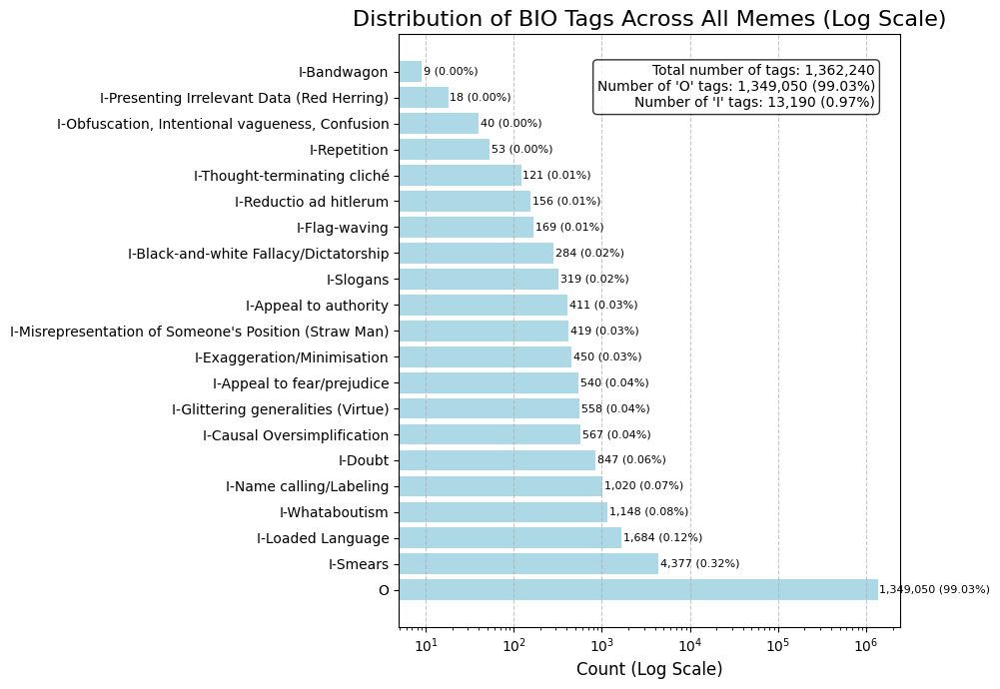

In [ ]:
# Count the frequency of each tag
tag_counts = Counter(all_tags)

# Sort the tags by count, in descending order
sorted_tags = sorted(tag_counts.items(), key=lambda x: x[1], reverse=True)

# Separate the tags and their counts
tags, counts = zip(*sorted_tags)

# Calculate percentages
total_tags = sum(counts)
percentages = [count / total_tags * 100 for count in counts]

# Create the horizontal bar plot with log scale
fig, ax = plt.subplots(figsize=(10, 7))
bars = plt.barh(tags, counts, color='lightblue')

# Set y-axis to log scale
plt.xscale('log')

# Customize the plot
ax.set_title('Distribution of BIO Tags Across All Memes (Log Scale)', fontsize=16)
ax.set_xlabel('Count (Log Scale)', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=10)

# Add count and percentage labels on the bars
for bar, percentage in zip(bars, percentages):
    width = bar.get_width()
    ax.text(width * 1.05, bar.get_y() + bar.get_height()/2,
            f'{width:,} ({percentage:.2f}%)',
            ha='left', va='center', fontsize=8)

# Add a grid for better readability
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add summary statistics text box
o_tags = tag_counts.get('O', 0)
i_tags = total_tags - o_tags
stats_text = f"Total number of tags: {total_tags:,}\n"
stats_text += f"Number of 'O' tags: {o_tags:,} ({o_tags/total_tags:.2%})\n"
stats_text += f"Number of 'I' tags: {i_tags:,} ({i_tags/total_tags:.2%})"

# Place the text box in the top right corner
ax.text(0.95, 0.95, stats_text, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

It's very important to realise that the x axis of this plot is LOG SCALE. There is extreme imbalance in technique labels, which has been exagerated by the requirement to identify which words are part of which techniques, and the padding of all texts to the max token length. This supports the use of F1 and focal loss for training and evaluating our model. It would be impossible to even the distributions using over sampling, both due to the extreme imbalance,and also due to the fact that individual memes, and even words from meme texts, have multiple labels, so duplicating a meme with the bandwagon technique may also increase the count of the smear or loaded language technique. A better method of evening the distrubution may be to combine some similar techniques such as 'Presenting Irrelevant Data (Red Herring)' and 'Obfuscation, Intentional vagueness, Confusion' which are both poorly represented int he dataset and could be deemed to be related, however combining categories is considered beyond the scope of this project, especially as we are less concerned with a high performing model (see project F1 score goal in accompanying 3 page report) and more concerned with building a working solution within our constraints.

In [ ]:
def rounded_percentage(numerator, denominator):
    return round(100 * numerator / denominator, 1) if denominator else 0.0

In [ ]:
#check the size of training, val and test datasets
n_training = len(training_ids)
n_val = len(val_ids)
n_test = len(test_ids)
n_total = n_training + n_val + n_test
n_training_labels = len([label for sublist in training_label_detail_lists for label in sublist])
n_val_labels = len([label for sublist in val_label_detail_lists for label in sublist])
n_test_labels = len([label for sublist in test_label_detail_lists for label in sublist])
n_total_labels = n_training_labels + n_val_labels + n_test_labels

print(f"training set contains {len(training_ids)} images and {len([label for sublist in training_label_detail_lists for label in sublist])} labels")
print(f"validation set contains {len(val_ids)} images and {len([label for sublist in val_label_detail_lists for label in sublist])} labels")
print(f"test set contains {len(test_ids)} images and {len([label for sublist in test_label_detail_lists for label in sublist])} labels")

training set contains 688 images and 1498 labels
validation set contains 64 images and 182 labels
test set contains 198 images and 402 labels


In [ ]:
# Create a DataFrame for the split percentages
data = {
    'Training': [rounded_percentage(n_training, n_total), rounded_percentage(n_training_labels, n_total_labels)],
    'Validation': [rounded_percentage(n_val, n_total), rounded_percentage(n_val_labels, n_total_labels)],
    'Test': [rounded_percentage(n_test, n_total), rounded_percentage(n_test_labels, n_total_labels)]

}

df = pd.DataFrame(data, index=['Memes', 'Labels'])
print(df)

        Training  Validation  Test
Memes       72.4         6.7  20.8
Labels      72.0         8.7  19.3


Here we see that the validation set particularly is very small, as we have such a small dataset, SemEval have set aside a larger than usual portion of the data for training. We will make a concious decision here to maintain the same split, in order to make the most of the very small dataset. If we had more computational resources we would consider using cross validation in order to not have to exclude data from training for validation purposes and potentially select a more robust model which performs consistently regardless of which data is used for validation.

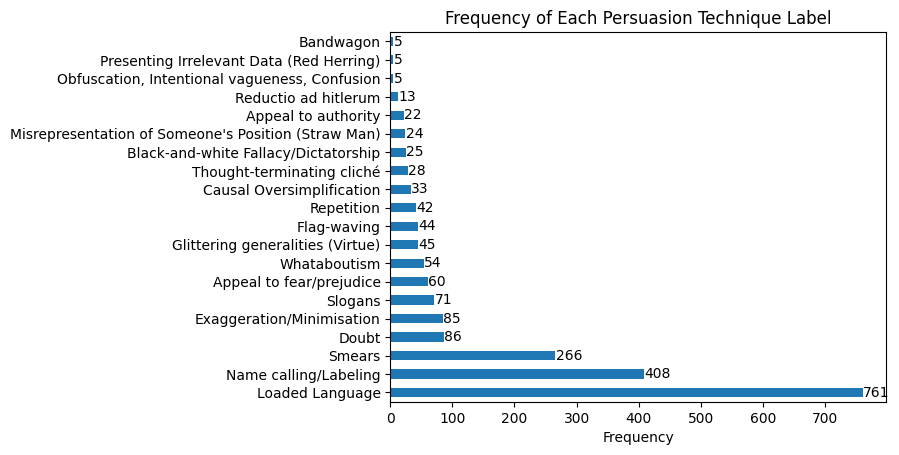

In [ ]:
#combine lists of ids, labels and texts into a data frame with an extra column for whether it is training, val or test
ids = []
texts = []
labels = []
datasets = []
starts = []
ends = []
text_fragments = []

for i in range(len(training_ids)):
    for j in range(len(training_label_detail_lists[i])):
        ids.append(training_ids[i])
        texts.append(training_texts[i])
        labels.append(training_label_detail_lists[i][j][2])
        starts.append(training_label_detail_lists[i][j][0])
        ends.append(training_label_detail_lists[i][j][1])
        text_fragments.append(training_label_detail_lists[i][j][3])
        datasets.append('training')

for i in range(len(val_ids)):
    for j in range(len(val_label_detail_lists[i])):
        ids.append(val_ids[i])
        texts.append(val_texts[i])
        labels.append(val_label_detail_lists[i][j][2])
        starts.append(val_label_detail_lists[i][j][0])
        ends.append(val_label_detail_lists[i][j][1])
        text_fragments.append(val_label_detail_lists[i][j][3])
        datasets.append('val')

for i in range(len(test_ids)):
    for j in range(len(test_label_detail_lists[i])):
        ids.append(test_ids[i])
        texts.append(test_texts[i])
        labels.append(test_label_detail_lists[i][j][2])
        starts.append(test_label_detail_lists[i][j][0])
        ends.append(test_label_detail_lists[i][j][1])
        text_fragments.append(test_label_detail_lists[i][j][3])
        datasets.append('test')

# Combine lists of ids, labels, texts, and datasets into a pandas DataFrame
data = {
    'id': ids,
    'text': texts,
    'label': labels,
    'dataset': datasets,
    'start': starts,
    'end': ends,
    'text_fragment': text_fragments
}

df_labels = pd.DataFrame(data)

# Assuming your DataFrame is named df and the column is 'label'
label_counts = df_labels['label'].value_counts()

# Plotting the horizontal bar chart
ax = label_counts.plot(kind='barh')

# Adding labels and title
plt.xlabel('Frequency')
plt.ylabel('')
plt.title('Frequency of Each Persuasion Technique Label')

# Annotating the bars with the frequency value
for i in ax.patches:
    ax.text(i.get_width() + 0.5, i.get_y() + i.get_height() / 2,
            str(int(i.get_width())),
            fontsize=10, color='black', verticalalignment='center')

plt.show()

This plot shows how extremely imbalanced the distribution of labels is across the dataset, with 3 labels only being present 5 times each whilst loaded language has been identified 761 times. The earlier plot of label distribution by token is a more meaningful representation of the imbalance present for the named entity recognition task.

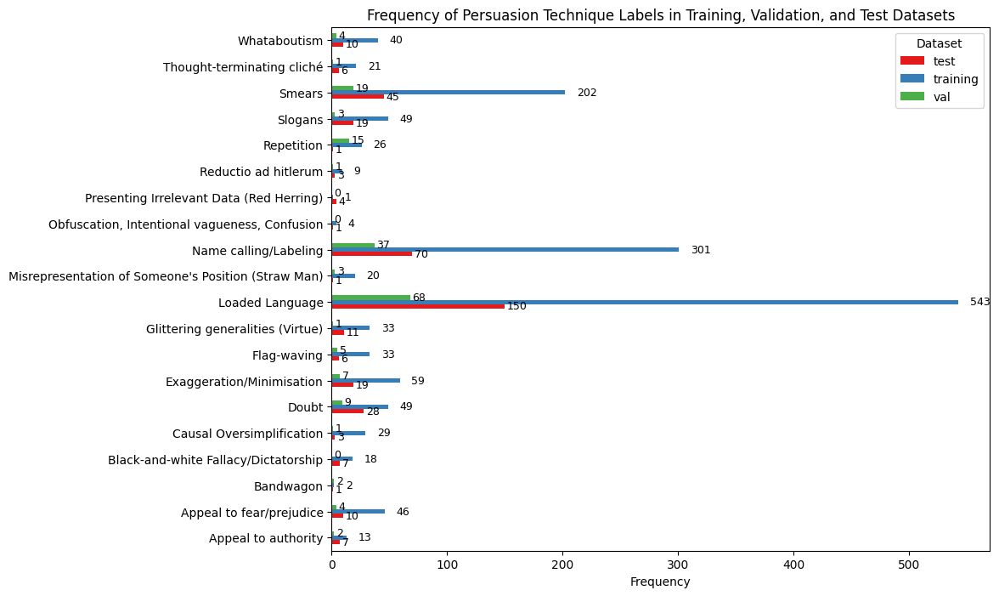

In [ ]:
label_dataset_counts = df_labels.groupby(['label', 'dataset']).size().unstack(fill_value=0)

colors = sns.color_palette("Set1", n_colors=3)

ax = label_dataset_counts.plot(kind='barh', stacked=False, color=colors, figsize=(10, 8))

#Add labels and title
plt.xlabel('Frequency')
plt.title('Frequency of Persuasion Technique Labels in Training, Validation, and Test Datasets')
plt.legend(title='Dataset')

#exclude ylabel
plt.ylabel('')

#Annotate each bar
for i, container in enumerate(ax.containers):
    #Adjust padding for the 'training' set
    if i == 1:
        ax.bar_label(container, label_type='edge', fontsize=9, padding=10)
    else:
        ax.bar_label(container, label_type='edge', fontsize=9, padding=2)

plt.show()

Looking deeper into the distribution of labels we can see that some labels (Presenting Irrelevant Data, Obfuscation, Black-and-white Fallacy) are not included in the validation set at all. This suggests that evaluating the performance of our model on the validation set will only tell us so much, when we check performance against the test set we will need to verify that the model is able to detect these persuasion techniques. The model is also going to be very unlikely to be able to identify "Presenting Irrelevant Data" "Obfuscation, Intentional vagueness, Confusion" or "Bandwagon" considering it has less than 5 of these labels in the training data. It would be a very good idea to fine tune the text feature extractor on an additional text dataset which has been labelled with these techniques (such as PTC-SemEval20), to increase the model's capability to identify the techniques used in that dataset.

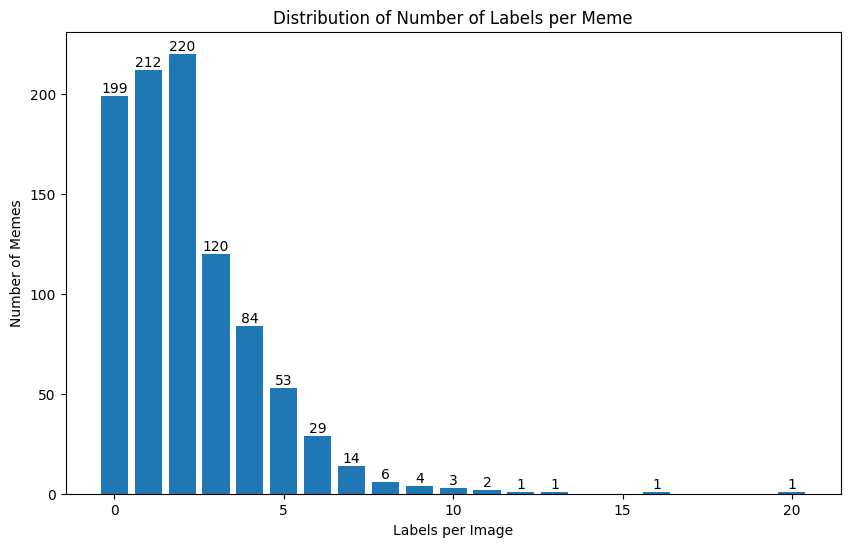

In [ ]:
all_label_detail_lists = training_label_detail_lists + val_label_detail_lists + test_label_detail_lists

# Count the length of each inner list (number of labels for each image)
lengths = [len(inner_list) for inner_list in all_label_detail_lists]

# Get the frequency of each unique length
length_counts = Counter(lengths)

# Prepare data for plotting
unique_lengths = list(length_counts.keys())
counts = list(length_counts.values())

# Step 4: Generate the bar plot
fig, ax = plt.subplots(figsize=(10, 6))  # Create a figure and axis
bars = ax.bar(unique_lengths, counts)  # Store bar containers

# Add labels to each bar
ax.bar_label(bars)

# Adding labels and title
ax.set_xlabel('Labels per Image')
ax.set_ylabel('Number of Memes')
ax.set_title('Distribution of Number of Labels per Meme')

# Display the plot
plt.show()


Although most images have less than 5 technique labels, there is a long tail with 6 images containing more than 10 persuasion technique labels.

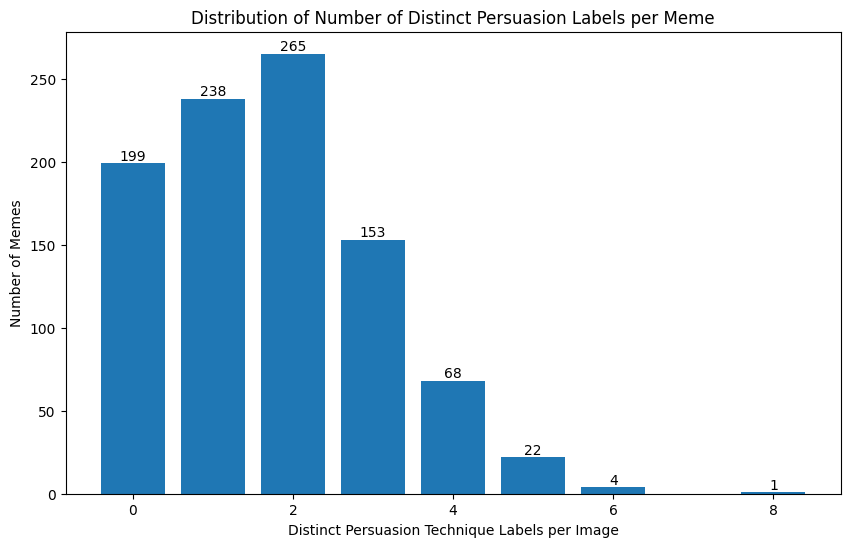

In [ ]:
#extract just the techniques from the list of lists of label details
all_label_technique_lists = []
for i, inner_list in enumerate(all_label_detail_lists):
    meme_specific_techniques = [item[2] for item in inner_list]
    all_label_technique_lists.append(meme_specific_techniques)

# Count the length of distinct techniques for each image
lengths = [len(set(inner_list)) for inner_list in all_label_technique_lists]

# Get the frequency of each unique length
length_counts = Counter(lengths)

# Prepare data for plotting
unique_lengths = list(length_counts.keys())
counts = list(length_counts.values())

# Step 4: Generate the bar plot
fig, ax = plt.subplots(figsize=(10, 6))  # Create a figure and axis
bars = ax.bar(unique_lengths, counts)  # Store bar containers

# Add labels to each bar
ax.bar_label(bars)

# Adding labels and title
ax.set_xlabel('Distinct Persuasion Technique Labels per Image')
ax.set_ylabel('Number of Memes')
ax.set_title('Distribution of Number of Distinct Persuasion Labels per Meme')

# Display the plot
plt.show()

Although 6 images had more than 10 technique labels, it is evident from this plot that many of those labels were the same technique used multiple times in the meme, as in this plot we can see that only 5 memes contain more than 5 distinct persuasion technique labels.

In [ ]:
df_labels.head(10)

,id,text,label,dataset,start,end,text_fragment
0,128,THERE ARE ONLY TWO GENDERS\n\nFEMALE \n\nMALE\n,Black-and-white Fallacy/Dictatorship,training,0,41,THERE ARE ONLY TWO GENDERS\n\nFEMALE \n\nMALE
1,96,SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE EH?\...,Slogans,training,47,83,POWER COMES FROM THE BARREL OF A GUN
2,96,SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE EH?\...,Name calling/Labeling,training,3,14,BERNIE BROS
3,96,SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE EH?\...,Loaded Language,training,33,41,VIOLENCE
4,96,SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE EH?\...,Loaded Language,training,163,175,MASS SHOOTER
5,96,SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE EH?\...,Loaded Language,training,85,93,COMRADES
6,96,SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE EH?\...,Smears,training,0,176,SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE EH?\...
7,154,PATHETIC\n\nThe Cowardly Asshole\nWeak Failure...,Loaded Language,training,0,8,PATHETIC
8,154,PATHETIC\n\nThe Cowardly Asshole\nWeak Failure...,Name calling/Labeling,training,0,8,PATHETIC
9,154,PATHETIC\n\nThe Cowardly Asshole\nWeak Failure...,Name calling/Labeling,training,14,30,Cowardly Asshole


It is evident from looking at these examples that words can have multiple labels, i.e. persuasion techniques can overlap. For example "SO BERNIE BROS HAVEN'T COMMITTED VIOLENCE" is considered Smears and "BERNIE BROS" is considered Name calling/Labeling. Therefore the model needs to be able to label tokens with multiple persuasion techniques.

In [ ]:
#randomly sample 5 rows from df_labels
df_labels.sample(5)

,id,text,label,dataset,start,end,text_fragment
1312,667_batch_2,"Ok, explain this to me again...\n\nExactly how...",Loaded Language,training,50,103,breaking blood vessels and causing clots and b...
459,22_batch_2,"""Kenosha Mile"" Challenge\n\nRun 684 ft, all al...",Whataboutism,training,292,357,witch-hunted as a murderer while your country ...
1035,528_batch_2,DEMOCRATIC CONGRESSWOMAN ALEXANDRIA ORTIZ CORT...,Loaded Language,training,66,94,BLOW COVID PARTICLES BUBBLES
534,198_batch_2,THEY TOLD ME I COULD BE ANYTHING I WANTED\n\nS...,Name calling/Labeling,training,55,89,THE SAVIOR OF WESTERN CIVILIZATION
670,304_batch_2,THE PARTY THAT CONSTANTLY CALLS THE RIGHT RACI...,Name calling/Labeling,training,42,48,RACIST


This simply shows the nature of the data labelling, which is what we will be training the model to do. Our prediction needs to encompass the start and end indices of the text fragment which is using one of the 20 persuasion techniques, so it will need to predict from tokens, taking into account punctuation. You can also see that some text fragments may represent just one word while others could encompass the entire text.

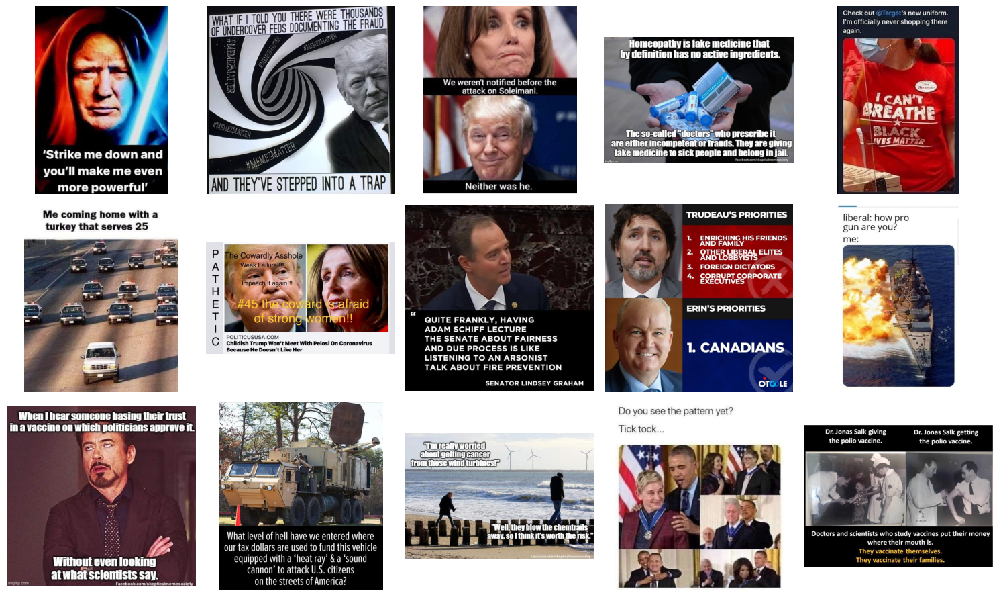

In [ ]:
#load and view a random sample of images
all_images_links = training_images_link + val_images_link + test_images_link

# Select 15 random images from all_images_links
random_images = np.random.choice(all_images_links, size=15, replace=False)

# Create a figure with subplots (3 rows and 5 columns)
fig, axs = plt.subplots(3, 5, figsize=(15, 9))  # Adjusted figsize for better viewing

# Flatten the axes array for easy indexing
axs = axs.flatten()

# Loop through the selected images and display them
for ax, image_link in zip(axs, random_images):
    img = Image.open(image_link)
    ax.imshow(img)
    ax.axis('off')  # Hide the axes

# Remove any empty subplots (if any)
for i in range(len(random_images), len(axs)):
    axs[i].axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()

Here we see a random sample of 15 memes from the dataset. A few things can be noted here:

  a) the persuasion techniques could be impossible to identify without considering the image, for example in the middle top image the reference to Trump is lost without the image

  b) the images come in different shapes and sizes, including landscape, portrait and square, the resizing will fix both these but it will be important to consider how this impacts the images
  
  c) between this and the sample of 5 rows from the dataset above, it is clear that the relationship between the images, text, and persuasion techniques is very complex, will require complex models and will be challenging

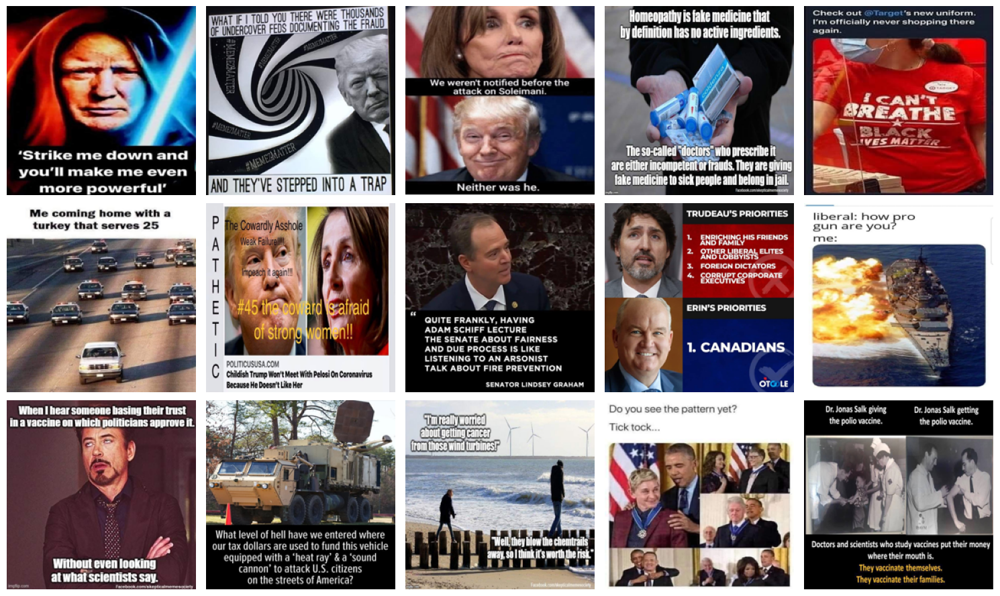

In [ ]:
# Function to load and preprocess images
def load_images(image_list):
    images = []
    for image in image_list:
        # Open the image
        img = Image.open(image)
        # Resize the image to 224x224
        img = img.resize((224, 224))
        # Add to list of images
        images.append(img)
    return images

# Load and preprocess the random images
resized_images = load_images(random_images)

# Create a figure with subplots (3 rows and 5 columns)
fig, axs = plt.subplots(3, 5, figsize=(15, 9))

# Flatten the axes array for easy indexing
axs = axs.flatten()

# Loop through the resized images and display them
for ax, img in zip(axs, resized_images):
    ax.imshow(img)
    ax.axis('off')  # Hide the axes

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()

Whilst some images with an extreme aspect ratio such as the top right meme have been quite distorted, it is still possible to identify distinguishing features, such as in this example, that the images are all women. The resizing seems to have been very effective.

Finally, let's check the BIO tagging by viewing all the labels for an image and then viewing it's BIO tag csv file

In [ ]:
#select a column at random (as long as it's not from test set)
rng = np.random.default_rng(seed=4)
rng.choice(df_labels['id'], size=1, replace=False)

array(['9_batch_2'], dtype=object)

In [ ]:
#show the label details for this meme with all the text showing
pd.set_option('display.max_colwidth', None)
df_labels[df_labels['id'] == "9_batch_2"]

,id,text,label,dataset,start,end,text_fragment
1512,9_batch_2,"Definition Of Stupid:\n\nKnowing The Truth, Seeing The Truth, but still Believing in TRUDEAU!\n",Doubt,val,0,91,"Definition Of Stupid:\n\nKnowing The Truth, Seeing The Truth, but still Believing in TRUDEAU!"
1513,9_batch_2,"Definition Of Stupid:\n\nKnowing The Truth, Seeing The Truth, but still Believing in TRUDEAU!\n",Loaded Language,val,14,20,Stupid
1514,9_batch_2,"Definition Of Stupid:\n\nKnowing The Truth, Seeing The Truth, but still Believing in TRUDEAU!\n",Name calling/Labeling,val,14,20,Stupid
1515,9_batch_2,"Definition Of Stupid:\n\nKnowing The Truth, Seeing The Truth, but still Believing in TRUDEAU!\n",Smears,val,0,91,"Definition Of Stupid:\n\nKnowing The Truth, Seeing The Truth, but still Believing in TRUDEAU!"


The reandomly selected meme has 4 persuasion techniques labelled, all of which overlap

In [ ]:
#pull the csv and show some columns inc. relevant persuasion techniques
df_BIO_tags_9_batch_2 = pd.read_csv('./BIO_CSVs/val/9_batch_2.csv')
df_BIO_tags_9_batch_2.iloc[:22, [0, 1, 5, 7, 9, 11, 16, 17, 20]]

,token,Appeal to authority,Doubt,Flag-waving,Loaded Language,Name calling/Labeling,Slogans,Smears,Bandwagon
0,▁definition,O,I-Doubt,O,O,O,O,I-Smears,O
1,▁of,O,I-Doubt,O,O,O,O,I-Smears,O
2,▁stupid,O,I-Doubt,O,I-Loaded Language,I-Name calling/Labeling,O,I-Smears,O
3,:,O,I-Doubt,O,O,O,O,I-Smears,O
4,▁knowing,O,I-Doubt,O,O,O,O,I-Smears,O
5,▁the,O,I-Doubt,O,O,O,O,I-Smears,O
6,▁truth,O,I-Doubt,O,O,O,O,I-Smears,O
7,",",O,I-Doubt,O,O,O,O,I-Smears,O
8,▁seeing,O,I-Doubt,O,O,O,O,I-Smears,O
9,▁the,O,I-Doubt,O,O,O,O,I-Smears,O


The BIO labels are all correct - this is what the model needs to predict for this meme to score 100%

In [ ]:
#get the index of the above meme in our various lists
val_ids.index("9_batch_2")

6

In [ ]:
#number of lists of BIO tag lists (1/meme in validation set) - should be 63
print(len(val_BIO_tag_list_lists))
#number of BIO tag lists for meme #6 in val set (1/persuasion technique) - should be 20
print(len(val_BIO_tag_list_lists[6]))
#number of words in each BIO tag list (words in meme #6 text) - should be 14
print(len(val_BIO_tag_list_lists[6][8]))
#tokens from meme #6
print(val_full_text_token_lists[6])
#BIO tag lists for meme #6 technique #4
print(val_BIO_tag_list_lists[6][4])

64
20
99
['▁definition', '▁of', '▁stupid', ':', '▁knowing', '▁the', '▁truth', ',', '▁seeing', '▁the', '▁truth', ',', '▁but', '▁still', '▁believing', '▁in', '▁trudeau', '!', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']
['I-Doubt', 'I-Doubt', 'I-Doubt', 'I-Doubt', 'I-Doubt', 'I-Doubt', 'I-Doubt', 'I-Doubt', 'I-Doubt'

This just shows the meaning of some of our lists generated from the BIO tag CSVs.

In [ ]:
flattened_val_BIO_tag_list = [item for sublist in val_BIO_tag_list_lists for item in sublist]
flattened_val_BIO_tag_list = [item for sublist in flattened_val_BIO_tag_list for item in sublist]

# flattened_val_BIO_tag_list
# Count unique values
value_counts = Counter(flattened_val_BIO_tag_list)

# Create a DataFrame from the counts
df_counts = pd.DataFrame(value_counts.items(), columns=['Value', 'Count'])

# Calculate the proportion of total unique values
df_counts['Percentage'] = 100 * df_counts['Count'] / df_counts['Count'].sum()

# Display the results
print(df_counts.to_string(index=False))

                                                Value  Count  Percentage
                                                    O 125172   98.778409
                                    I-Loaded Language    190    0.149937
                              I-Name calling/Labeling    115    0.090751
                          I-Exaggeration/Minimisation     68    0.053662
I-Misrepresentation of Someone's Position (Straw Man)     72    0.056818
                                              I-Doubt    199    0.157039
                                             I-Smears    511    0.403251
                          I-Causal Oversimplification      6    0.004735
                           I-Appeal to fear/prejudice     42    0.033144
                                         I-Repetition     29    0.022885
                                        I-Flag-waving     33    0.026042
                                            I-Slogans     12    0.009470
                         I-Thought-terminating clic

In [ ]:
df_counts['Count'].sum()

126720

This is critical because it shows that within the validation set 98.8% of labels are 'O' labels, so the imbalance in the dataset has been exacerbated by the BIO tagging process. If we were using accuracy as a metric the model could acheive 98.8% by classifying all tokens as 'O'. Meanwhile it would only achieve a 4.7% macro f1 score and 0% micro f1 score with all the I labels used as the positive class. This is why we will focus on macro f1 scores as the target metric for this project, effectively treating each class with equal importance as they are weighted equally in the f1 score calculation.

maximum token length amungst meme text: 99
mean token length amungst meme text: 23.68
median token length amungst meme text: 20.0


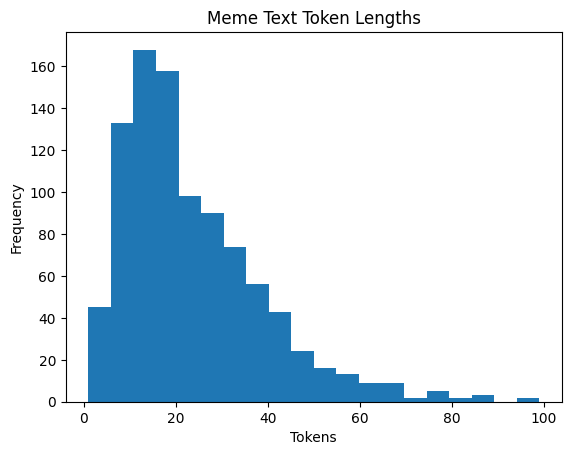

In [ ]:
ave_length = np.mean(text_token_lengths)
med_length = np.median(text_token_lengths)

#print them
print(f"maximum token length amungst meme text: {max_length}")
print(f"mean token length amungst meme text: {round(ave_length,2)}")
print(f"median token length amungst meme text: {med_length}")

#plot the distribution
plt.hist(text_token_lengths, bins=20)
plt.xlabel('Tokens')
plt.ylabel('Frequency')
plt.title('Meme Text Token Lengths')
plt.show()

Here we see most of the meme texts are less than 30 tokens in length, whilst some outliers are over 80 tokens long.

### Text Preprocessing

Now I need to generate BIO tags for each technique for each meme in the training and development/validation datasets as they will be needed for comparing model predictions against the labels.

In [17]:
def flatten_and_encode_labels(tags, input_ids, techniques, tokenizer):
    mlb = MultiLabelBinarizer()
    classes = [f"I-{t}" for t in techniques] + ["O"]
    mlb.fit([classes])

    encoded_labels = []
    for meme_tags, ids in zip(tags, input_ids):
        # Identify indices of non-[CLS] and non-[SEP] tokens
        valid_indices = [i for i, id in enumerate(ids) if id not in [tokenizer.cls_token_id, tokenizer.sep_token_id]]

        # Keep padding tokens
        valid_meme_tags = [[tag_list[i] if i < len(tag_list) else 'O' for i in range(len(ids))] for tag_list in meme_tags]

        meme_encoded = []
        for technique_tags in zip(*valid_meme_tags):
            flattened_tags = [tag for tag in technique_tags if tag != 'O']
            if not flattened_tags:
                flattened_tags = ['O']
            encoded = mlb.transform([flattened_tags])[0]
            meme_encoded.append(encoded)

        encoded_labels.append(np.array(meme_encoded))

    return encoded_labels, mlb

Max token length (99) was calculated above for data exploration purposes but will also be used herein for specification in the model inputs.

I am making a decision here to pad all my tokenized texts to the same length. Although it may slightly reduce model performance, exacerbate class imbalance and increase computational demands, it reduces the complexity of model development which is important so that the author can understand the process and be able to efficiently optimize and analyze the model.

In [18]:
#load the tokenizer - using ATF to suppress the loading bar
tokenizer = ATF.from_pretrained('albert-base-v2')

# Create text encodings
def create_encodings(texts, tokenizer, max_length):
    return tokenizer(texts, padding='max_length', truncation=True, max_length=max_length, return_tensors="pt")

training_text_encodings = create_encodings(training_texts, tokenizer, max_length)
val_text_encodings = create_encodings(val_texts, tokenizer, max_length)
test_text_encodings = create_encodings(test_texts, tokenizer, max_length)

In [19]:
# Create label encodings
training_label_encodings, mlb = flatten_and_encode_labels(train_BIO_tag_list_lists, training_text_encodings['input_ids'], techniques, tokenizer)
val_label_encodings, _ = flatten_and_encode_labels(val_BIO_tag_list_lists, val_text_encodings['input_ids'], techniques, tokenizer)
test_label_encodings, _ = flatten_and_encode_labels(test_BIO_tag_list_lists, test_text_encodings['input_ids'], techniques, tokenizer)

# Get the mapping from index to label and back
id2tag = {i: label for i, label in enumerate(mlb.classes_)}
tag2id = {label: i for i, label in id2tag.items()}

In [20]:
val_label_encodings[6][4]

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0])

I am verifying here that the presence of a technique is labelled as a 1 (positive class) and the lack of a technique is labelled as a 0.

In [21]:
print(f"Training label encodings has {len(training_label_encodings)} memes x {training_label_encodings[0].shape} tokens and categories")

Training label encodings has 688 memes x (99, 21) tokens and categories


In [22]:
#convert labels to numpy arrays
train_labels_tensor = np.array([np.stack(meme_labels) for meme_labels in training_label_encodings])
val_labels_tensor = np.array([np.stack(meme_labels) for meme_labels in val_label_encodings])
test_labels_tensor = np.array([np.stack(meme_labels) for meme_labels in test_label_encodings])

In [23]:
#convert training text inputs to tensors
input_ids = tf.convert_to_tensor(training_text_encodings['input_ids'])
attention_mask = tf.convert_to_tensor(training_text_encodings['attention_mask'])

#convert validation text inputs to tensors
val_input_ids = tf.convert_to_tensor(val_text_encodings['input_ids'])
val_attention_mask = tf.convert_to_tensor(val_text_encodings['attention_mask'])

#convert test text inputs to tensors
test_input_ids = tf.convert_to_tensor(test_text_encodings['input_ids'])
test_attention_mask = tf.convert_to_tensor(test_text_encodings['attention_mask'])

In [24]:
print("Train labels shape:         ", train_labels_tensor.shape)
print("Train input_ids shape:      ", input_ids.shape)
print("Train attention_mask shape: ", attention_mask.shape)
print("Train images shape:         ", training_images.shape)
print()
print("Val labels shape:          ", val_labels_tensor.shape)
print("Val input_ids shape:       ", val_input_ids.shape)
print("Val attention_mask shape:  ", val_attention_mask.shape)
print("Val images shape:          ", val_labels_tensor.shape)
print()
print("Test labels shape:         ", test_labels_tensor.shape)
print("Test input_ids shape:      ", test_input_ids.shape)
print("Test attention_mask shape: ", test_attention_mask.shape)
print("Test images shape:         ", test_images.shape)

Train labels shape:          (688, 99, 21)
Train input_ids shape:       (688, 99)
Train attention_mask shape:  (688, 99)
Train images shape:          (688, 224, 224, 3)

Val labels shape:           (64, 99, 21)
Val input_ids shape:        (64, 99)
Val attention_mask shape:   (64, 99)
Val images shape:           (64, 99, 21)

Test labels shape:          (198, 99, 21)
Test input_ids shape:       (198, 99)
Test attention_mask shape:  (198, 99)
Test images shape:          (198, 224, 224, 3)


In [25]:
num_classes = train_labels_tensor.shape[-1]
print(f"Number of classes: {num_classes}")

Number of classes: 21


### Load models

Decisions & justification:

* 224x224x3 is used as the input size as this is what we resized all the images to (because ResNet is pretrained on this size image)

* We use the resnet preprocess_input funtion to ensure the images are preprocessed inline with the techniques used for resnet pretraining

* We use the base model trained on imagenet as this dataset and its labelling is very relevant to the feature extraction we need in order to identify persuasion techniques in memes

* I am not adding MLP heads to ResNet or Albert in order to start with as simple of a model as possible, leaving all options for added complexity on the table in the case it is needed

* Albert was selected as it is a version of BERT which is more computationally efficient and easier to train, with parameters reused between layers. Again this is to keep the model small and simple to begin with. If the model does not achieve the desired level of performance a larger model such as BERT or RoBERTa could be substituted in order to increase model complexity.

* The pooled extracted image features are repeated for each token before concatenation so that the model may model any connection between the image features and each text token

* A simple concatenation is used, again, to keep the model as simple as possible. A more complex fusion technique utilizing a transformer model could be leveraged later if performance is sub-optimal.

* No fully connected layer is added before the final prediction layer to keep the model as simple as possible

* The final layer has 41 nodes to represent the 41 possible token labels. Sigmoid activation is used to allow the model to allocate an individual category to multiple tokens.

* No global average pooling used (for enhanced task) onthe text model in order to retain the text sequence information as it will be needed for the prediction

* Optional dropout is included on the text and image feature outputs and the global average pooling of the image features. I'll discuss justification of dropout later but the placement in 2 layers of the image feature extractor helps in regularizing different levels of feature abstraction

* Layer freezing:

   - Freeze the pretrained text and image models to retain the feature extraction abilities they developed during pretraining, and especially due to our small dataset size for fine tuning.
   - fine tuning the text model will be considered if higher performance is required, however to begin with we leave them frozen to save on computation requirements. tuning the text model was recommended in the paper for a very similar project (1213Li - P. Li, X. Li, X. Sun, 2021)

In [26]:
def load_model(dropout=0):
    #RESNET

    # set up image input
    image_input = tf.keras.Input(shape=(224, 224, 3))

    # Preprocess input images for ResNet
    preprocess_input = tf.keras.applications.resnet.preprocess_input
    preprocessed_image_input = preprocess_input(image_input)

    # Load the pretrained ResNet50 model without top (fully connected) layers
    resnet_base = tf.keras.applications.ResNet50(weights='imagenet', include_top=False)

    # Pass the image input through ResNet50's convolutional base
    image_output = resnet_base(image_input)
    image_output_dropout = tf.keras.layers.Dropout(dropout)(image_output)

    # Add GlobalAveragePooling2D to flatten the output into 1D vector
    pooled_image_output = tf.keras.layers.GlobalAveragePooling2D()(image_output_dropout)
    pooled_image_output_dropout = tf.keras.layers.Dropout(dropout)(pooled_image_output)

    #ALBERT

    # Load ALBERT model
    text_model = TFAlbertModel.from_pretrained('albert-base-v2')

    # Define input layers for tokenized data (input IDs and attention mask)
    input_ids = tf.keras.Input(shape=(max_length,), dtype=tf.int32, name='input_ids')
    attention_mask = tf.keras.Input(shape=(max_length,), dtype=tf.int32, name='attention_mask')

    # Pass inputs through ALBERT model
    bert_outputs = text_model(input_ids=input_ids, attention_mask=attention_mask)

    # Extract the last hidden state
    text_output = bert_outputs.last_hidden_state

    text_output_dropout = tf.keras.layers.Dropout(dropout)(text_output)

    #COMBINE

    # Repeat the image features for each token in the sequence
    repeated_image_output = tf.keras.layers.RepeatVector(max_length)(pooled_image_output_dropout)

    # Concatenate image and text outputs
    combined_outputs = tf.keras.layers.concatenate([repeated_image_output, text_output_dropout])

    # Add a time-distributed dense layer for final classification
    final_output = tf.keras.layers.TimeDistributed(
        tf.keras.layers.Dense(num_classes, activation='sigmoid'))(combined_outputs)

    # Define the complete model
    model = tf.keras.Model(inputs=[image_input, input_ids, attention_mask], outputs=final_output)

    #freeze all but the final layer
    for layer in model.layers:
        layer.trainable = False

    #unfreeze the final layer
    model.layers[-1].trainable = True

    return model

model = load_model()

# Check the model architecture
model.summary()

94765736/94765736 [==============================] - 0s 0us/step


model.safetensors:   0%|          | 0.00/47.4M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFAlbertModel: ['predictions.decoder.bias', 'predictions.dense.weight', 'predictions.bias', 'predictions.dense.bias', 'predictions.LayerNorm.bias', 'predictions.LayerNorm.weight']
- This IS expected if you are initializing TFAlbertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFAlbertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFAlbertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFAlbertModel for predictions without further training.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 resnet50 (Functional)       (None, None, None, 2048)     2358771   ['input_1[0][0]']             
                                                          2                                       
                                                                                                  
 dropout (Dropout)           (None, 7, 7, 2048)           0         ['resnet50[0][0]']            
                                                                                                  
 global_average_pooling2d (  (None, 2048)                 0         ['dropout[0][0]']         

In [27]:
# print the trainable status of each layer
for layer in model.layers:
    print(f"{layer.name}: trainable = {layer.trainable}")

input_1: trainable = False
resnet50: trainable = False
dropout: trainable = False
global_average_pooling2d: trainable = False
input_ids: trainable = False
attention_mask: trainable = False
dropout_1: trainable = False
tf_albert_model: trainable = False
repeat_vector: trainable = False
dropout_6: trainable = False
concatenate: trainable = False
time_distributed: trainable = True


We'll track all the precision, recall and f1 metrics, because we easily can and they may provide important insight into model performance.

In [44]:
#define callbacks

#function to generate validation predictions and calculate metrics vs labels
def calculate_ner_metrics(y_true, y_pred, n_classes):
    # Exclude the 'O' label from calculations
    y_true_techniques = y_true[:, :-1]
    y_pred_techniques = y_pred[:, :-1]

    # Calculate metrics for each technique
    precision_per_class, recall_per_class, f1_per_class, _ = precision_recall_fscore_support(
        y_true_techniques, y_pred_techniques, average=None, zero_division=0
    )

    # Calculate micro-average metrics
    TP = np.sum(np.logical_and(y_true_techniques == 1, y_pred_techniques == 1))
    FP = np.sum(np.logical_and(y_true_techniques == 0, y_pred_techniques == 1))
    FN = np.sum(np.logical_and(y_true_techniques == 1, y_pred_techniques == 0))

    micro_precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    micro_recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    micro_f1 = 2 * (micro_precision * micro_recall) / (micro_precision + micro_recall) if (micro_precision + micro_recall) > 0 else 0

    # Calculate macro-average metrics
    macro_precision = np.mean(precision_per_class)
    macro_recall = np.mean(recall_per_class)
    macro_f1 = np.mean(f1_per_class)

    return {
        'micro_f1': micro_f1,
        'micro_precision': micro_precision,
        'micro_recall': micro_recall,
        'macro_f1': macro_f1,
        'macro_precision': macro_precision,
        'macro_recall': macro_recall,
        'precision_per_class': precision_per_class,
        'recall_per_class': recall_per_class,
        'f1_per_class': f1_per_class
    }

def calculate_metrics(model, val_data, val_labels):
    # Unpack validation data
    val_images, val_input_ids, val_attention_mask = val_data

    # Get predictions
    predictions = model.predict([val_images, val_input_ids, val_attention_mask], verbose=0)

    # Convert predictions to binary (0 or 1)
    predictions_binary = (predictions > 0.5).astype(int)

    # Flatten the predictions and labels
    pred_flat = predictions_binary.reshape(-1, predictions_binary.shape[-1])
    true_flat = val_labels.reshape(-1, val_labels.shape[-1])

    # Calculate metrics
    metrics = calculate_ner_metrics(true_flat, pred_flat, true_flat.shape[1])

    return metrics

#custom callback to calculate metrics after each epoch
class MetricsCallback(tf.keras.callbacks.Callback):
    def __init__(self, val_data, val_labels, silent=True):
        super().__init__()
        self.val_data = val_data
        self.val_labels = val_labels
        self.silent = silent

    def on_epoch_end(self, epoch, logs=None):
        metrics = calculate_metrics(self.model, self.val_data, self.val_labels)
        for name, value in metrics.items():
            if not self.silent:
                print(f"\nVal {name}: {value:.4f}")
            logs[f'val_{name}'] = value

metrics_callback = MetricsCallback(([val_images,
                                     val_input_ids,
                                     val_attention_mask]),
                                   val_labels_tensor)

#early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose=1
    # restore_best_weights=True #unnecesary as I am saving weights after each epoch, then shutil best epoch to drive
)

#shuffling
class ShufflingCallback(tf.keras.callbacks.Callback):
    def __init__(self, training_data, labels):
        self.training_data = training_data
        self.labels = labels
        self.dataset_size = tf.shape(labels)[0]

    def on_epoch_begin(self, epoch, logs=None):
        # Generate shuffled indices
        indices = tf.random.shuffle(tf.range(self.dataset_size))

        # Shuffle all input arrays and labels
        shuffled_data = []
        for data in self.training_data:
            shuffled_data.append(tf.gather(data, indices))
        shuffled_labels = tf.gather(self.labels, indices)

        # Update the model's input data and labels
        self.model.x = shuffled_data
        self.model.y = shuffled_labels

shuffle = ShufflingCallback(
    training_data=[training_images, input_ids, attention_mask],
    labels=train_labels_tensor
)

#model checkpointing
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'best_model_epoch_{epoch:02d}.weights.h5',
    verbose=0,
    save_freq='epoch',
    save_weights_only=True
)

#list of callbacks
callbacks = [metrics_callback, early_stopping, shuffle, checkpoint]

We will use focal loss with parameters as per a related project. These are also considered a good starting point for a NER problem with extreme class imbalance such as ours. If the scope of this project was more extensive, these parameters should definitely be tuned as their optimal values will be specific to this NER task and label preprocessing technique.

In [29]:
#set the loss function
loss = tf.keras.losses.BinaryFocalCrossentropy(
    alpha=0.9,
    gamma=2.0
)

In [30]:
#initiate a dictionary for model training histories
history = {}

In [31]:
# Calculate steps per epoch
steps_per_epoch_train = len(training_ids) // 8
steps_per_epoch_val = len(val_ids) // 8

Initial learning rate was determined experimentally, initially with learning rate = 5e-6 for 50+ epochs, training was extremely stable with val loss improving 0.0001-0.0002 per epoch after 50 epochs and training was stopped via keyboard interruption. A related study also quoted use of a learning rate 0.0001 and through experimentation before model development was finalized, this was determined to be a good starting point. From here on, this model will be considered the base model.

In [32]:
import logging
logging.getLogger("transformers").setLevel(logging.ERROR)

In [45]:
model = load_model()

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=optimizer, loss=loss)

# Create a small batch of data
small_batch = [
    training_images[:1],
    input_ids[:1],
    attention_mask[:1]
]

# Call the model once to initialize all variables
_ = model(small_batch)

history['basic_model'] = model.fit(
            x=[training_images,
            input_ids,
            attention_mask],
            y=train_labels_tensor,
            epochs=50,
            steps_per_epoch = steps_per_epoch_train,
            batch_size=8,
            validation_data=([val_images,val_input_ids,
                              val_attention_mask],
                              val_labels_tensor),
            validation_steps=steps_per_epoch_val,
            callbacks=callbacks,
            verbose=0)

Epoch 46: early stopping
Restoring model weights from the end of the best epoch: 41.


In [46]:
def plot_history(history_dict, selected_model=None, top=0.04):
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    # Loss plot
    axes[0, 0].set_title('Training and Validation Focal Loss')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')

    # Micro Metrics plot
    axes[0, 1].set_title('Validation Micro Metrics')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Metric Score')

    # Macro Metrics plot
    axes[1, 0].set_title('Validation Macro Metrics')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Metric Score')

    # Top 5 Per-class F1 Scores plot
    axes[1, 1].set_title('Validation F1 Scores for Top 5 Classes')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('F1 Score')

    colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']
    micro_metrics = ['val_micro_f1', 'val_micro_precision', 'val_micro_recall']
    macro_metrics = ['val_macro_f1', 'val_macro_precision', 'val_macro_recall']
    top_5_classes = [6, 10, 12, 18, 20]  # The classes with the most support

    # If no model is selected, use the last one in the dictionary
    if selected_model is None:
        selected_model = list(history_dict.keys())[-1]

    min_val_losses = {}
    max_val_f1s_micro = {}
    max_val_f1s_macro = {}

    for i, (model_name, history) in enumerate(history_dict.items()):
        color = colors[i % len(colors)]

        # Create x-axis values starting from 1
        epochs = np.arange(1, len(history.history['loss']) + 1)

        # Loss
        axes[0, 0].plot(epochs, history.history['loss'], label=f'{model_name} Train', color=color)
        axes[0, 0].plot(epochs, history.history['val_loss'], label=f'{model_name} Val', color=color, linestyle='--')

        # Plot metrics only for the selected model
        if model_name == selected_model:
            for j, metric in enumerate(micro_metrics):
                if metric in history.history:
                    axes[0, 1].plot(epochs, history.history[metric], label=metric, color=colors[j % len(colors)])

            for j, metric in enumerate(macro_metrics):
                if metric in history.history:
                    axes[1, 0].plot(epochs, history.history[metric], label=metric, color=colors[j % len(colors)])

            # Plot F1 scores for top 5 classes
            for j, class_idx in enumerate(top_5_classes):
                class_f1_scores = [epoch_scores[class_idx-1] for epoch_scores in history.history['val_f1_per_class']]
                axes[1, 1].plot(epochs, class_f1_scores, label=f'Class {class_idx}', color=colors[j])

        # Calculate and store minimum validation loss and maximum F1 scores
        min_val_loss = min(history.history['val_loss'])
        min_val_loss_epoch = history.history['val_loss'].index(min_val_loss) + 1
        min_val_losses[model_name] = (min_val_loss, min_val_loss_epoch)

        max_val_macro_f1 = max(history.history['val_macro_f1'])
        max_val_macro_f1_epoch = history.history['val_macro_f1'].index(max_val_macro_f1) + 1
        max_val_f1s_macro[model_name] = (max_val_macro_f1, max_val_macro_f1_epoch)

        max_val_micro_f1 = max(history.history['val_micro_f1'])
        max_val_micro_f1_epoch = history.history['val_micro_f1'].index(max_val_micro_f1) + 1
        max_val_f1s_micro[model_name] = (max_val_micro_f1, max_val_micro_f1_epoch)

    for ax in axes.flat:
        ax.legend()
        ax.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

    # Print minimum validation losses and macro F1 scores
    print("\nMinimum Validation Losses and Maximum Macro & Micro F1 Scores:")
    for model_name in min_val_losses.keys():
        min_loss, epoch_loss = min_val_losses[model_name]
        max_f1_macro, epoch_f1_macro = max_val_f1s_macro[model_name]
        max_f1_micro, epoch_f1_micro = max_val_f1s_micro[model_name]

        print(f"{model_name}: {min_loss:.6f} (Epoch {epoch_loss}), {max_f1_macro:.4f} (Epoch {epoch_f1_macro}), {max_f1_micro:.4f} (Epoch {epoch_f1_micro})")

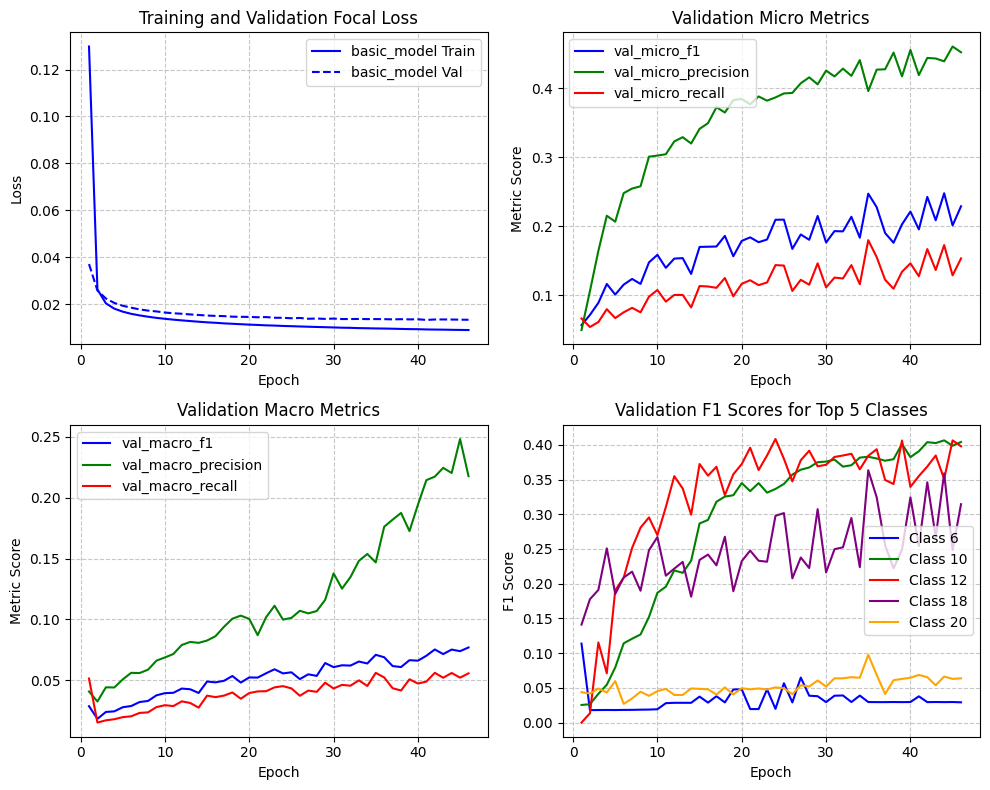


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
basic_model: 0.013235 (Epoch 41), 0.0770 (Epoch 46), 0.2477 (Epoch 44)


In [47]:
plot_history(history, 'basic_model')

In [48]:
source_path = 'best_model_epoch_44.weights.h5'
destination_path = '/content/drive/My Drive/DeepLearningAss2/model_weights/base_model.weights.h5'
shutil.copy(source_path, destination_path)

'/content/drive/My Drive/DeepLearningAss2/model_weights/base_model.weights.h5'

Observation:

* minor overfitting - training losses lower than validation losses
* overfitting very minor partially thanks to early stopping
* stopped early - converged after 41 epochs
* training is very stable with progressive validation loss improvement
* macro f1 scores below target
* micro f1 score plateaued (albiet volatile) after 35 epochs but macro f1 showing incremental improvement - likely symptom of focal loss chasing improvement from the harder to classify classes.

Remedy:

* a more complex text model like BERT, fine tuning the text feature extractor layers or fine tuning the text classifier on an additional dataset would be the ideal options for providing higher macro f1 scores. However, we are only 2% from our macro f1 score goal, and achieving our micro f1 goal, therefore these tasks are deemed to be outside project scope, as we can likely achieve our goal via hyperparameter tuning.

* focussing on the high number of epochs to converge, high stability of training and computational restrictions, I will begin by tuning the learning rate
   - increasing it may allow the model to converge faster, saving computational resources
   - decreasing it may make model training more stable, allowing it to reach converge closer to the optimal solution
   - either option could potentially result in better performance

### Tuning learning rate

Higher learning rate - learning rate is usually adjusted logarithmically, let's try increasing by a factor of 5

In [49]:
model = load_model()

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)

model.compile(optimizer=optimizer, loss=loss)

small_batch = [
    training_images[:1],
    input_ids[:1],
    attention_mask[:1]
]

_ = model(small_batch)

history['basic_model_higher_lr'] = model.fit(
            x=[training_images,
            input_ids,
            attention_mask],
            y=train_labels_tensor,
            epochs=50,
            steps_per_epoch = steps_per_epoch_train,
            batch_size=8,
            validation_data=([val_images,val_input_ids,
                              val_attention_mask],
                              val_labels_tensor),
            validation_steps=steps_per_epoch_val,
            callbacks=callbacks,
            verbose=0)

Epoch 18: early stopping
Restoring model weights from the end of the best epoch: 13.


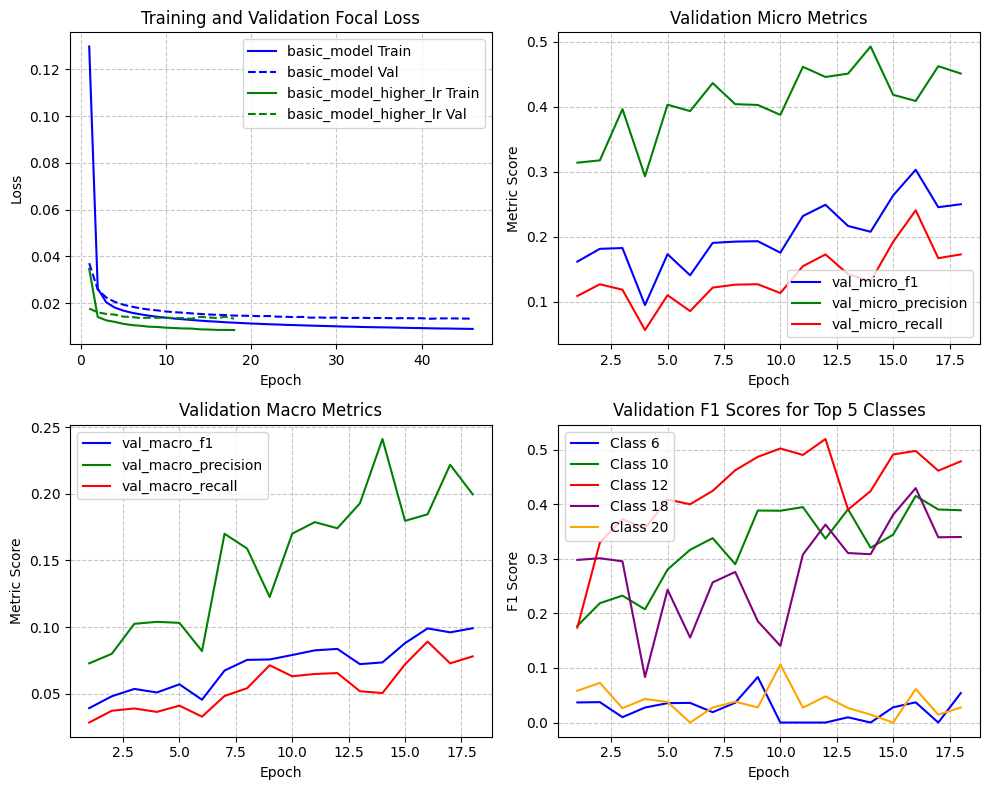


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
basic_model: 0.013235 (Epoch 41), 0.0770 (Epoch 46), 0.2477 (Epoch 44)
basic_model_higher_lr: 0.013246 (Epoch 13), 0.0991 (Epoch 18), 0.3033 (Epoch 16)


In [50]:
plot_history(history, 'basic_model_higher_lr')

In [51]:
source_path = 'best_model_epoch_16.weights.h5'
destination_path = '/content/drive/My Drive/DeepLearningAss2/model_weights/high_lr_model.weights.h5'
shutil.copy(source_path, destination_path)

'/content/drive/My Drive/DeepLearningAss2/model_weights/high_lr_model.weights.h5'

Observation:

* Faster convergence with comparable minimum validation loss
* overfitting has become slightly more prominent
* converged after 13 epochs however epoch 16 produced the highest micro f1 score and equivalent to the best macro f1 score of ~10%

Remedy:

* As the training process is already quite unstable and the model converges in a small number of epochs, an even faster learning rate would likely not produce a very robust model, but it is worth trying a learning rate between the 2 tried so far to see if performance could be improved. It would be good to try a slower learning rate for the sake of experimentation and identifying any potential trend, but the first model already took close to 50 epochs to converge and so in the interest of minimizing computational resource use we will assume that a slower learning rate would result in poorer performance.



In [52]:
model = load_model()

optimizer = tf.keras.optimizers.Adam(learning_rate=0.00025)

model.compile(optimizer=optimizer, loss=loss)

small_batch = [
    training_images[:1],
    input_ids[:1],
    attention_mask[:1]
]

_ = model(small_batch)

history['basic_model_med_high_lr'] = model.fit(
            x=[training_images,
            input_ids,
            attention_mask],
            y=train_labels_tensor,
            epochs=50,
            steps_per_epoch = steps_per_epoch_train,
            batch_size=8,
            validation_data=([val_images,val_input_ids,
                              val_attention_mask],
                              val_labels_tensor),
            validation_steps=steps_per_epoch_val,
            callbacks=callbacks,
            verbose=0)

Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 17.


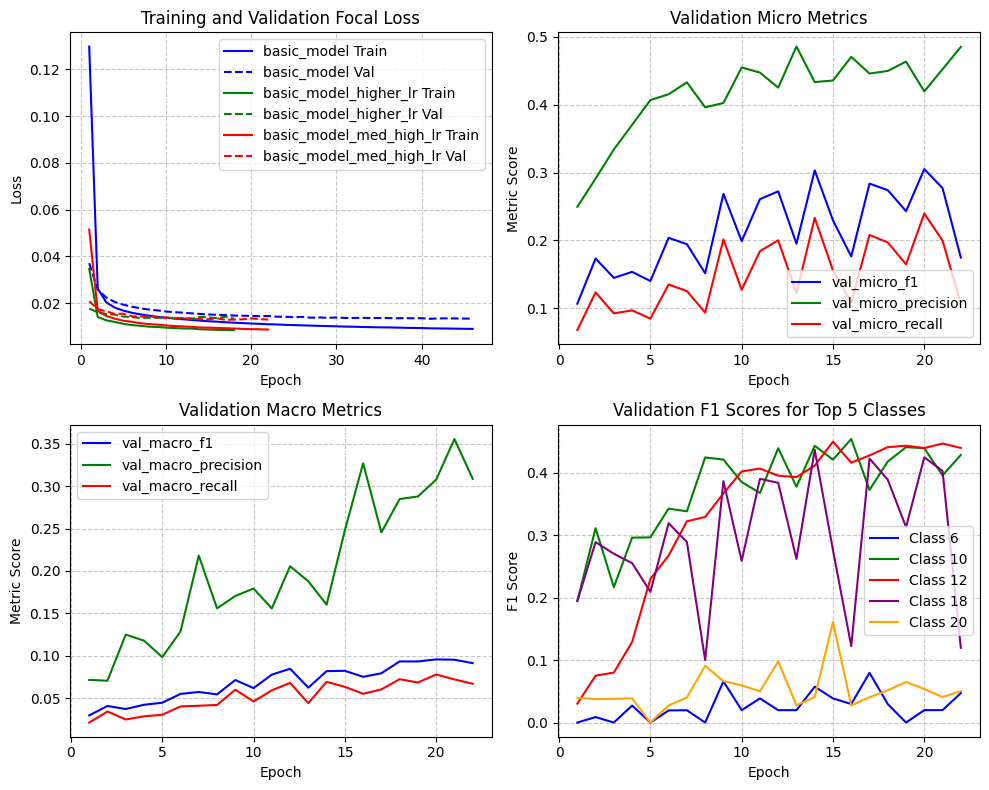


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
basic_model: 0.013235 (Epoch 41), 0.0770 (Epoch 46), 0.2477 (Epoch 44)
basic_model_higher_lr: 0.013246 (Epoch 13), 0.0991 (Epoch 18), 0.3033 (Epoch 16)
basic_model_med_high_lr: 0.012806 (Epoch 17), 0.0956 (Epoch 20), 0.3051 (Epoch 20)


In [53]:
plot_history(history, 'basic_model_med_high_lr')

In [54]:
source_path = 'best_model_epoch_20.weights.h5'
destination_path = '/content/drive/My Drive/DeepLearningAss2/model_weights/med_high_lr_model.weights.h5'
shutil.copy(source_path, destination_path)

'/content/drive/My Drive/DeepLearningAss2/model_weights/med_high_lr_model.weights.h5'

Observations:

* reinforces the trend that higher learning rate provided better macro f-1 scores with slightly more overfitting, within the range we have experimented with
* med-high learning rate produced lowest loss and highest micro f-1 score with slightly lower macro f1 score than the high lr model (9.6% vs 9.9%)
* Interesting to note varied performance across techniques and epochs with epoch 15 achieving over 15% f1 score for class 20 (Whataboutism), 50% higher than the highest f1 score seen thus far for that class.
* It is also interesting to observe that Class 12 (name calling/labelling) has very progressive improvement of its f1 score during training compared with the sporadic improvement in other classes, potentially this is a sign that these labels are more simple to model but it is hard to say

Remedy:

* Try a stepped learning rate decay schedule to see if we can get the higher performance from the higher learning rate combined with progressively more stable learning as the model approaches the local minimum and avoid triggering early stopping due to instability

In [55]:
#learning rate scheduler
def custom_lr_scheduler(epoch, lr):
    if epoch < 6:
        return 0.0005
    elif epoch < 11:
        return 0.00025
    else:
        return 0.0001

#define the callback
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(custom_lr_scheduler)

#append the callback
callbacks.append(lr_scheduler)

In [56]:
model = load_model()

optimizer = tf.keras.optimizers.Adam()

model.compile(optimizer=optimizer, loss=loss)

small_batch = [
    training_images[:1],
    input_ids[:1],
    attention_mask[:1]
]

_ = model(small_batch)

history['basic_model_scheduled_lr'] = model.fit(
            x=[training_images,
            input_ids,
            attention_mask],
            y=train_labels_tensor,
            epochs=50,
            steps_per_epoch = steps_per_epoch_train,
            batch_size=8,
            validation_data=([val_images,val_input_ids,
                              val_attention_mask],
                              val_labels_tensor),
            validation_steps=steps_per_epoch_val,
            callbacks=callbacks,
            verbose=0)

Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 17.


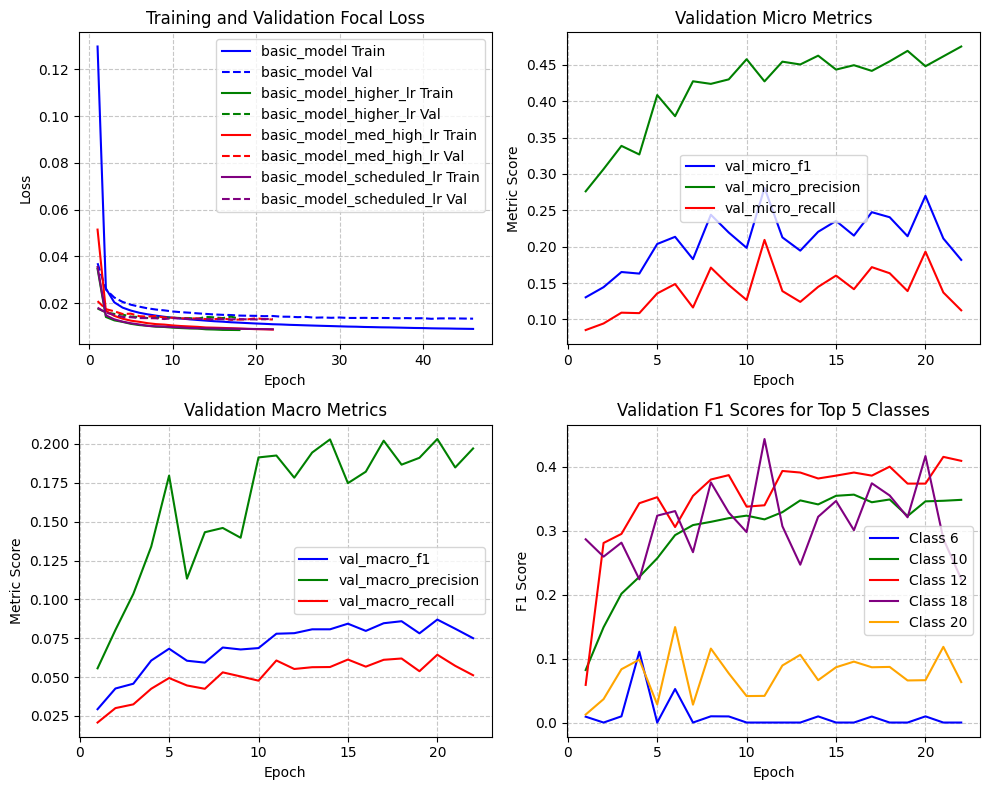


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
basic_model: 0.013235 (Epoch 41), 0.0770 (Epoch 46), 0.2477 (Epoch 44)
basic_model_higher_lr: 0.013246 (Epoch 13), 0.0991 (Epoch 18), 0.3033 (Epoch 16)
basic_model_med_high_lr: 0.012806 (Epoch 17), 0.0956 (Epoch 20), 0.3051 (Epoch 20)
basic_model_scheduled_lr: 0.012957 (Epoch 17), 0.0870 (Epoch 20), 0.2810 (Epoch 11)


In [57]:
plot_history(history, 'basic_model_scheduled_lr')

In [58]:
#save best model weights
shutil.copy('best_model_epoch_20.weights.h5',
            '/content/drive/My Drive/DeepLearningAss2/scheduled_lr_model.weights.h5')

'/content/drive/My Drive/DeepLearningAss2/scheduled_lr_model.weights.h5'

Observations:
* higher stability allowed it to train for longer than the high learning rate model converging after 17 epochs
* worse f1 scores compared to previous 2 models

Overall observations:
* modest overfitting
* high lr provides best performance

Rectification:
* lr decay schedule is good in theory but failed to provide better results
* see if instead we can find a sweet spot between the med_high and high learning rates

In [59]:
callbacks.remove(lr_scheduler)

In [61]:
model = load_model()

optimizer = tf.keras.optimizers.Adam(learning_rate=0.00038)

model.compile(optimizer=optimizer, loss=loss)

small_batch = [
    training_images[:1],
    input_ids[:1],
    attention_mask[:1]
]

_ = model(small_batch)

history['basic_model_moderately_high_lr'] = model.fit(
            x=[training_images,
            input_ids,
            attention_mask],
            y=train_labels_tensor,
            epochs=50,
            steps_per_epoch = steps_per_epoch_train,
            batch_size=8,
            validation_data=([val_images,val_input_ids,
                              val_attention_mask],
                              val_labels_tensor),
            validation_steps=steps_per_epoch_val,
            callbacks=callbacks,
            verbose=0)

Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 18.


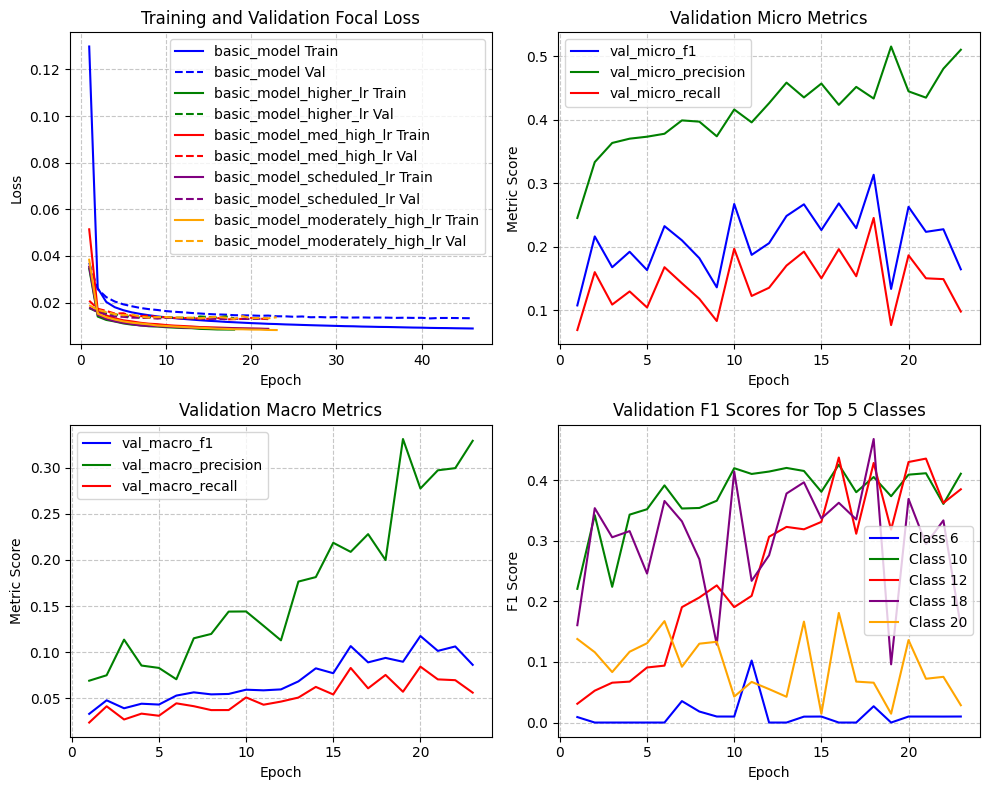


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
basic_model: 0.013235 (Epoch 41), 0.0770 (Epoch 46), 0.2477 (Epoch 44)
basic_model_higher_lr: 0.013246 (Epoch 13), 0.0991 (Epoch 18), 0.3033 (Epoch 16)
basic_model_med_high_lr: 0.012806 (Epoch 17), 0.0956 (Epoch 20), 0.3051 (Epoch 20)
basic_model_scheduled_lr: 0.012957 (Epoch 17), 0.0870 (Epoch 20), 0.2810 (Epoch 11)
basic_model_moderately_high_lr: 0.013003 (Epoch 18), 0.1175 (Epoch 20), 0.3134 (Epoch 18)


In [62]:
plot_history(history, 'basic_model_moderately_high_lr')

In [74]:
#save best model weights
shutil.copy('best_model_epoch_20.weights.h5',
            '/content/drive/My Drive/DeepLearningAss2/model_weights/moderately_high_lr_model.weights.h5')

'/content/drive/My Drive/DeepLearningAss2/model_weights/moderately_high_lr_model.weights.h5'

Observations:
* best macro and micro f1 scores so far, big macro f1 score improvement, which is where we are struggling the most to meet the project goal.
* epoch 20 has highest macro f1, also with good micro f1 score

Remedy
* this is best model
* move onto regularizing the model

### Tuning dropout

Suitable options for regularization include l1, l2 and dropout regularization as well as early stopping which is already being used. Dropout is often preferred due to its beneficial nature on models, allowing them to not depend strongly on particular features due to that feature not being present when the necessary nodes in the network get "dropped out" during training. We will try dropout values incrementing up from 0 (already tried) to 0.3 to see the model performance impact and which dropout provides the best performance.

In [64]:
history2 = {}

In [66]:
for i, d_o in enumerate([0.0, 0.1, 0.2, 0.3]):
    model = load_model(dropout=d_o)

    model_name = f"{str(d_o)}_dropout_moderate_high_lr_model"

    # Define the checkpoint callback inside the loop
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath=f'{model_name}_epoch_{{epoch:02d}}.weights.h5',
        save_weights_only=True,
        save_freq='epoch',
        verbose=0
    )

    callbacks = [metrics_callback, early_stopping, checkpoint, shuffle]

    optimizer = tf.keras.optimizers.Adam(learning_rate=0.00038)

    model.compile(optimizer=optimizer, loss=loss)

    # Create a small batch of data
    small_batch = [
        training_images[:1],
        input_ids[:1],
        attention_mask[:1]
    ]

    # Call the model once to initialize all variables
    _ = model(small_batch)

    history2[model_name] = model.fit(
                x=[training_images,
                input_ids,
                attention_mask],
                y=train_labels_tensor,
                epochs=50,
                steps_per_epoch = steps_per_epoch_train,
                batch_size=8,
                validation_data=([val_images,val_input_ids,
                                  val_attention_mask],
                                  val_labels_tensor),
                validation_steps=steps_per_epoch_val,
                callbacks=callbacks,
                verbose=0)

Epoch 17: early stopping
Restoring model weights from the end of the best epoch: 12.
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 18.
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 17.
Epoch 19: early stopping
Restoring model weights from the end of the best epoch: 14.


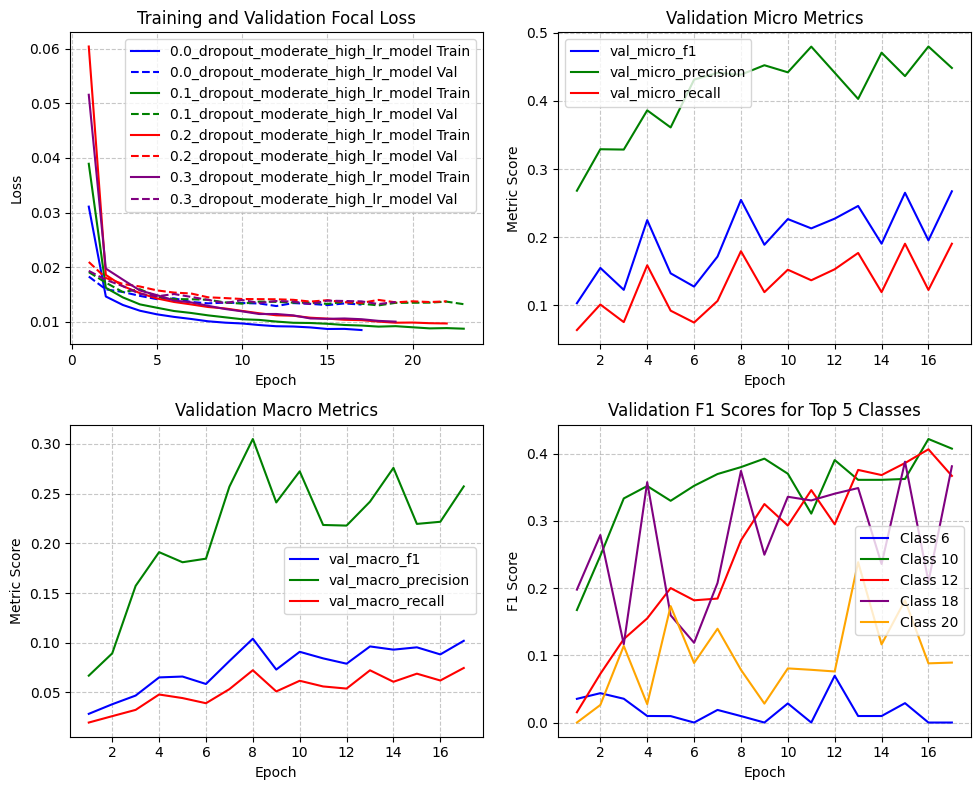


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
0.0_dropout_moderate_high_lr_model: 0.012902 (Epoch 12), 0.1040 (Epoch 8), 0.2675 (Epoch 17)
0.1_dropout_moderate_high_lr_model: 0.013023 (Epoch 18), 0.1014 (Epoch 23), 0.3296 (Epoch 8)
0.2_dropout_moderate_high_lr_model: 0.013488 (Epoch 17), 0.0870 (Epoch 20), 0.3161 (Epoch 20)
0.3_dropout_moderate_high_lr_model: 0.013266 (Epoch 14), 0.0857 (Epoch 7), 0.2957 (Epoch 7)


In [67]:
plot_history(history2, '0.0_dropout_moderate_high_lr_model')

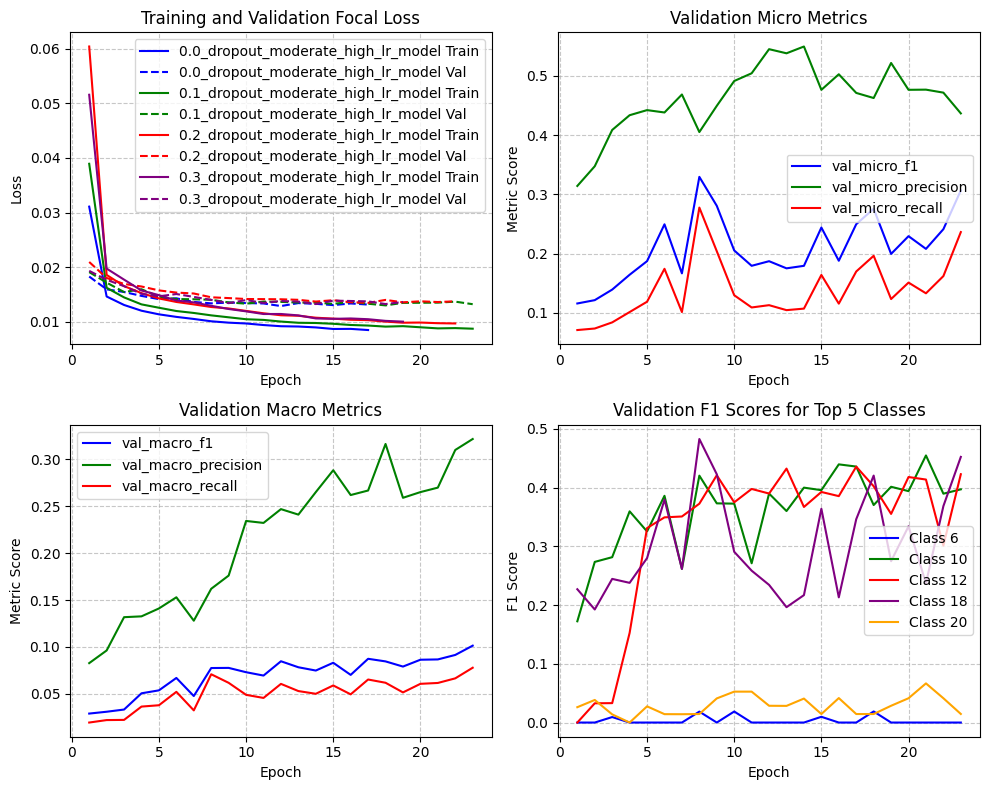


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
0.0_dropout_moderate_high_lr_model: 0.012902 (Epoch 12), 0.1040 (Epoch 8), 0.2675 (Epoch 17)
0.1_dropout_moderate_high_lr_model: 0.013023 (Epoch 18), 0.1014 (Epoch 23), 0.3296 (Epoch 8)
0.2_dropout_moderate_high_lr_model: 0.013488 (Epoch 17), 0.0870 (Epoch 20), 0.3161 (Epoch 20)
0.3_dropout_moderate_high_lr_model: 0.013266 (Epoch 14), 0.0857 (Epoch 7), 0.2957 (Epoch 7)


In [68]:
plot_history(history2, '0.1_dropout_moderate_high_lr_model')

Observations:
* dropouts of 0 and 0.1 achieved above project goal for macro and micro f1 on epochs 8 and 23 respectively
* 0.1 dropout model appears to have improving macro and micro f1 scored when early stopping stopped training
* Generally it's safe to say dropout caused more stable training with less overfitting and naturally, consistently higher training losses.

Remedy:
* Remove early stopping to see if better performance is achieved with 0.1 dropout model

In [73]:
source_path = '0.1_dropout_moderate_high_lr_model_epoch_23.weights.h5'
destination_path = '/content/drive/My Drive/DeepLearningAss2/model_weights/dropout_moderate_high_lr_model.weights.h5'
shutil.copy(source_path, destination_path)

'/content/drive/My Drive/DeepLearningAss2/model_weights/dropout_moderate_high_lr_model.weights.h5'

In [70]:
model = load_model(dropout=0.1)

model_name = "0.1_dropout_moderate_high_lr_model_no_early_stopping"

# Define the checkpoint callback inside the loop
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=f'{model_name}_epoch_{{epoch:02d}}.weights.h5',
    save_weights_only=True,
    save_freq='epoch',
    verbose=0
)

callbacks = [metrics_callback, checkpoint, shuffle]

optimizer = tf.keras.optimizers.Adam(learning_rate=0.00038)

model.compile(optimizer=optimizer, loss=loss)

# Create a small batch of data
small_batch = [
    training_images[:1],
    input_ids[:1],
    attention_mask[:1]
]

# Call the model once to initialize all variables
_ = model(small_batch)

history2[model_name] = model.fit(
            x=[training_images,
            input_ids,
            attention_mask],
            y=train_labels_tensor,
            epochs=50,
            steps_per_epoch = steps_per_epoch_train,
            batch_size=8,
            validation_data=([val_images,val_input_ids,
                              val_attention_mask],
                              val_labels_tensor),
            validation_steps=steps_per_epoch_val,
            callbacks=callbacks,
            verbose=0)

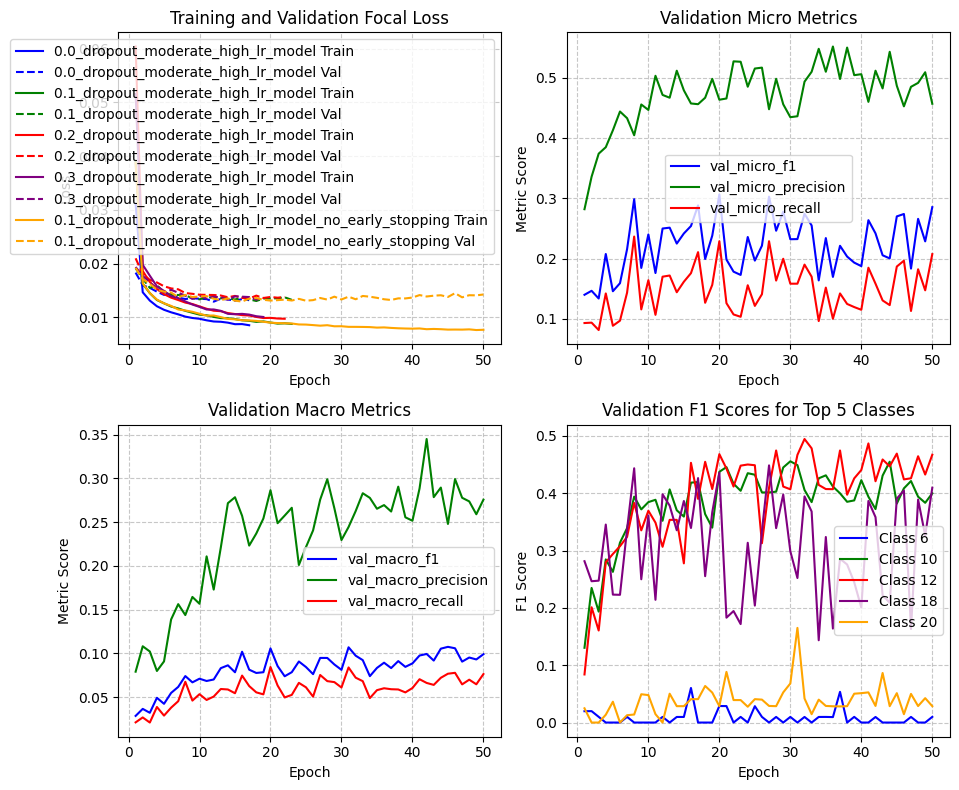


Minimum Validation Losses and Maximum Macro & Micro F1 Scores:
0.0_dropout_moderate_high_lr_model: 0.012902 (Epoch 12), 0.1040 (Epoch 8), 0.2675 (Epoch 17)
0.1_dropout_moderate_high_lr_model: 0.013023 (Epoch 18), 0.1014 (Epoch 23), 0.3296 (Epoch 8)
0.2_dropout_moderate_high_lr_model: 0.013488 (Epoch 17), 0.0870 (Epoch 20), 0.3161 (Epoch 20)
0.3_dropout_moderate_high_lr_model: 0.013266 (Epoch 14), 0.0857 (Epoch 7), 0.2957 (Epoch 7)
0.1_dropout_moderate_high_lr_model_no_early_stopping: 0.012922 (Epoch 16), 0.1074 (Epoch 45), 0.3062 (Epoch 20)


In [71]:
plot_history(history2, '0.1_dropout_moderate_high_lr_model_no_early_stopping')

Observations:

As would be expected, macro f1 score was marginally improved in later epochs (thanks to the focal loss) but this was at the cost of lower micro f1 scores and a higher level of overfitting which the early stopping has so far been preventing. This confirms early stopping has been working well to prevent computational waste and not preventing us from finding better models.

Remedy:

* move forward with best 0.1 dropout model and best model with no regularization


### Model evaluation and selection

Let's start by loading back the best models and the base model.

In [77]:
#copy base model weights
shutil.copy('/content/drive/My Drive/DeepLearningAss2/model_weights/base_model.weights.h5',
            'base_model.weights.h5')
#copy best model weights post learning rate tuning
shutil.copy('/content/drive/My Drive/DeepLearningAss2/model_weights/moderately_high_lr_model.weights.h5',
            'moderate_high_lr_model.weights.h5')
#copy best model weights post regularization tuning
shutil.copy('/content/drive/My Drive/DeepLearningAss2/model_weights/dropout_moderate_high_lr_model.weights.h5',
            'dropout_moderate_high_lr_model.weights.h5')

'dropout_moderate_high_lr_model.weights.h5'

In [78]:
#load model from best_model.weights.h5
model = load_model()
model.load_weights('base_model.weights.h5')

Then predicting for the validation dataset.

In [79]:
#predict for validation data
val_predictions = model.predict([val_images, val_input_ids, val_attention_mask],
                                verbose=0)

# Convert predictions to binary (0 or 1)
val_predictions_binary = (val_predictions > 0.5).astype(int)

#flatten validation predictions and validation labels
val_pred_flat = val_predictions_binary.reshape(-1, val_predictions_binary.shape[-1])
val_labels_flat = val_labels_tensor.reshape(-1, val_labels_tensor.shape[-1])

Now let's build a classification report.

In [80]:
# import sklearn.metrics
from IPython.display import display

def new_calculate_ner_metrics(y_true, y_pred, n_classes):
# Exclude the 'O' label from calculations
    y_true_techniques = y_true[:, :-1]
    y_pred_techniques = y_pred[:, :-1]

    # Calculate metrics for each technique
    TP = np.sum(np.logical_and(y_true_techniques == 1, y_pred_techniques == 1), axis=0)
    FP = np.sum(np.logical_and(y_true_techniques == 0, y_pred_techniques == 1), axis=0)
    FN = np.sum(np.logical_and(y_true_techniques == 1, y_pred_techniques == 0), axis=0)

    # Calculate precision, recall, and F1 score with explicit handling of edge cases
    precision = np.zeros_like(TP, dtype=float)
    recall = np.zeros_like(TP, dtype=float)
    f1 = np.zeros_like(TP, dtype=float)

    for i in range(len(TP)):
        if TP[i] + FP[i] > 0:
            precision[i] = TP[i] / (TP[i] + FP[i])
        if TP[i] + FN[i] > 0:
            recall[i] = TP[i] / (TP[i] + FN[i])
        if precision[i] + recall[i] > 0:
            f1[i] = 2 * (precision[i] * recall[i]) / (precision[i] + recall[i])

    support = np.sum(y_true_techniques, axis=0)

    # Calculate micro-average metrics
    micro_TP = np.sum(TP)
    micro_FP = np.sum(FP)
    micro_FN = np.sum(FN)

    micro_precision = micro_TP / (micro_TP + micro_FP) if (micro_TP + micro_FP) > 0 else 0
    micro_recall = micro_TP / (micro_TP + micro_FN) if (micro_TP + micro_FN) > 0 else 0
    micro_f1 = 2 * (micro_precision * micro_recall) / (micro_precision + micro_recall) if (micro_precision + micro_recall) > 0 else 0

    # Calculate macro-average metrics
    macro_precision = np.mean(precision)
    macro_recall = np.mean(recall)
    macro_f1 = np.mean(f1)

    return precision, recall, f1, support, micro_precision, micro_recall, micro_f1, macro_precision, macro_recall, macro_f1

def create_ner_metrics_report(val_labels, val_pred, id2tag):
    n_classes = val_labels.shape[1] - 1  # Exclude 'O' label

    precision, recall, f1, support, micro_precision, micro_recall, micro_f1, macro_precision, macro_recall, macro_f1 = new_calculate_ner_metrics(val_labels, val_pred, n_classes)

    # Create a list to store the rows of our DataFrame
    rows = []

    # Add rows for individual classes
    for i in range(n_classes):
        class_name = id2tag[i]
        rows.append({
            'Class Name': class_name,
            'Precision': precision[i],
            'Recall': recall[i],
            'F1-Score': f1[i],
            'Support': int(support[i])
        })

    # Add rows for micro and macro averages
    rows.append({
        'Class Name': 'micro avg',
        'Precision': micro_precision,
        'Recall': micro_recall,
        'F1-Score': micro_f1,
        'Support': int(np.sum(support))
    })
    rows.append({
        'Class Name': 'macro avg',
        'Precision': macro_precision,
        'Recall': macro_recall,
        'F1-Score': macro_f1,
        'Support': int(np.sum(support))
    })

    # Create a DataFrame from the rows
    df = pd.DataFrame(rows)

    # Function to format floats
    def format_float(x):
        return '0' if x == 0 else f'{x:.4f}'

    # Apply the formatting to the float columns
    for col in ['Precision', 'Recall', 'F1-Score']:
        df[col] = df[col].apply(format_float)

    # Set display options for better formatting
    pd.set_option('display.float_format', '{:.4f}'.format)
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', None)

    return df

ner_metrics_df = create_ner_metrics_report(val_labels_flat, val_pred_flat, id2tag)

# Display the DataFrame
display(ner_metrics_df)

,Class Name,Precision,Recall,F1-Score,Support
0,I-Appeal to authority,0,0,0,48
1,I-Appeal to fear/prejudice,0,0,0,42
2,I-Bandwagon,0,0,0,21
3,I-Black-and-white Fallacy/Dictatorship,0,0,0,0
4,I-Causal Oversimplification,0,0,0,6
5,I-Doubt,0.6000,0.0151,0.0294,199
6,I-Exaggeration/Minimisation,0.3333,0.0147,0.0282,68
7,I-Flag-waving,0.6667,0.0606,0.1111,33
8,I-Glittering generalities (Virtue),0,0,0,43
9,I-Loaded Language,0.5250,0.3316,0.4065,190


This is the results for the base model (above)

In [82]:
model = load_model()
model.load_weights('dropout_moderate_high_lr_model.weights.h5')

#predict for validation data
val_predictions = model.predict([val_images, val_input_ids, val_attention_mask],
                                verbose=0)

# Convert predictions to binary (0 or 1)
val_predictions_binary = (val_predictions > 0.5).astype(int)

#flatten validation predictions and validation labels
val_pred_flat = val_predictions_binary.reshape(-1, val_predictions_binary.shape[-1])
val_labels_flat = val_labels_tensor.reshape(-1, val_labels_tensor.shape[-1])

ner_metrics_df = create_ner_metrics_report(val_labels_flat, val_pred_flat, id2tag)

# Display the DataFrame
display(ner_metrics_df)

,Class Name,Precision,Recall,F1-Score,Support
0,I-Appeal to authority,0.1111,0.0208,0.0351,48
1,I-Appeal to fear/prejudice,0.5000,0.0476,0.0870,42
2,I-Bandwagon,0,0,0,21
3,I-Black-and-white Fallacy/Dictatorship,0,0,0,0
4,I-Causal Oversimplification,0,0,0,6
5,I-Doubt,0,0,0,199
6,I-Exaggeration/Minimisation,1.0000,0.0294,0.0571,68
7,I-Flag-waving,0.5000,0.0606,0.1081,33
8,I-Glittering generalities (Virtue),0,0,0,43
9,I-Loaded Language,0.6322,0.2895,0.3971,190


Results above are for the model with 0.1 dropout.

In [103]:
model = load_model()
model.load_weights('moderate_high_lr_model.weights.h5')

#predict for validation data
val_predictions = model.predict([val_images, val_input_ids, val_attention_mask],
                                verbose=0)

# Convert predictions to binary (0 or 1)
val_predictions_binary = (val_predictions > 0.5).astype(int)

#flatten validation predictions and validation labels
val_pred_flat = val_predictions_binary.reshape(-1, val_predictions_binary.shape[-1])
val_labels_flat = val_labels_tensor.reshape(-1, val_labels_tensor.shape[-1])

ner_metrics_df = create_ner_metrics_report(val_labels_flat, val_pred_flat, id2tag)

# Display the DataFrame
display(ner_metrics_df)

,Class Name,Precision,Recall,F1-Score,Support
0,I-Appeal to authority,0,0,0,48
1,I-Appeal to fear/prejudice,0.1429,0.0714,0.0952,42
2,I-Bandwagon,0,0,0,21
3,I-Black-and-white Fallacy/Dictatorship,0,0,0,0
4,I-Causal Oversimplification,0,0,0,6
5,I-Doubt,0.3333,0.0050,0.0099,199
6,I-Exaggeration/Minimisation,0.5000,0.0441,0.0811,68
7,I-Flag-waving,0.5000,0.0909,0.1538,33
8,I-Glittering generalities (Virtue),0,0,0,43
9,I-Loaded Language,0.5487,0.3263,0.4092,190


Model selection:

* The base model performs significantly worse that the other 2 models across the board.
* The regularised model has higher micro f1 and lower macro f1. As we have excess micro f1 performance over our goal of 20% but we are only marginally above our macro f1 goal, I will select the unregularized model which has better macro f1 performance.

Best model analysis:

* The model struggled with false negatives more than false positives, as evident from the substantially worse recall than precision. In simple terms, when it asigns a persuasion technique to a token, it is right almost half the time (micro precision = 44%) but it doesn't asign techniques to many of the tokens which it should leading to many false negatives (micro recall 19%).
* Doubtn is a highly supported label which was only predicted correctly once from 3 predictions (33% precision vs 0.5% recall with 199 support). This displays the model's bias toward precision

* Strawman has quite high support but no predictions, indicating the model did not grasp any understanding of this persuasion technique.

Let's have a look at the relationship between f1score and support.

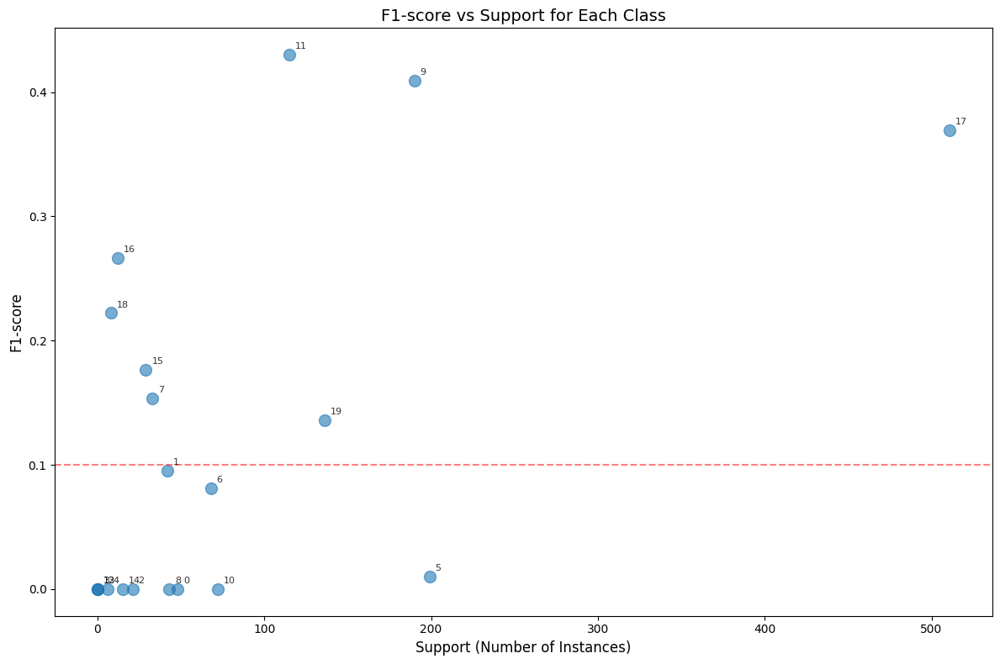

In [104]:
def plot_f1_vs_support(report_df):
    # Ensure the DataFrame is using the correct data types
    report_df = report_df.astype({'F1-Score': float, 'Support': int})

    # Extract F1-score and Support, excluding 'macro avg' and 'weighted avg'
    f1_scores = report_df['F1-Score'][:-2]
    supports = report_df['Support'][:-2]
    labels = report_df['Class Name'].index[:-2]

    # Create the scatter plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(supports, f1_scores, alpha=0.6, s=100)

    # Add labels and title
    plt.xlabel('Support (Number of Instances)', fontsize=12)
    plt.ylabel('F1-score', fontsize=12)
    plt.title('F1-score vs Support for Each Class', fontsize=14)

    # Add a horizontal line at y=0.1 for reference
    plt.axhline(y=0.1, color='r', linestyle='--', alpha=0.5)

    # Add text labels for each point
    for i, label in enumerate(labels):
        plt.annotate(label, (supports[i], f1_scores[i]), xytext=(5, 5),
                     textcoords='offset points', fontsize=8, alpha=0.8)

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

plot_f1_vs_support(ner_metrics_df)

This is the results for the best unregularized model.

Surpirsingly there is not a clear trend here, it seems the performance may have more to do with the model's ability to recognise the type of persuasuion technique in text rather than the support based on this plot.

Let's have a look at which techniques commonly occur together

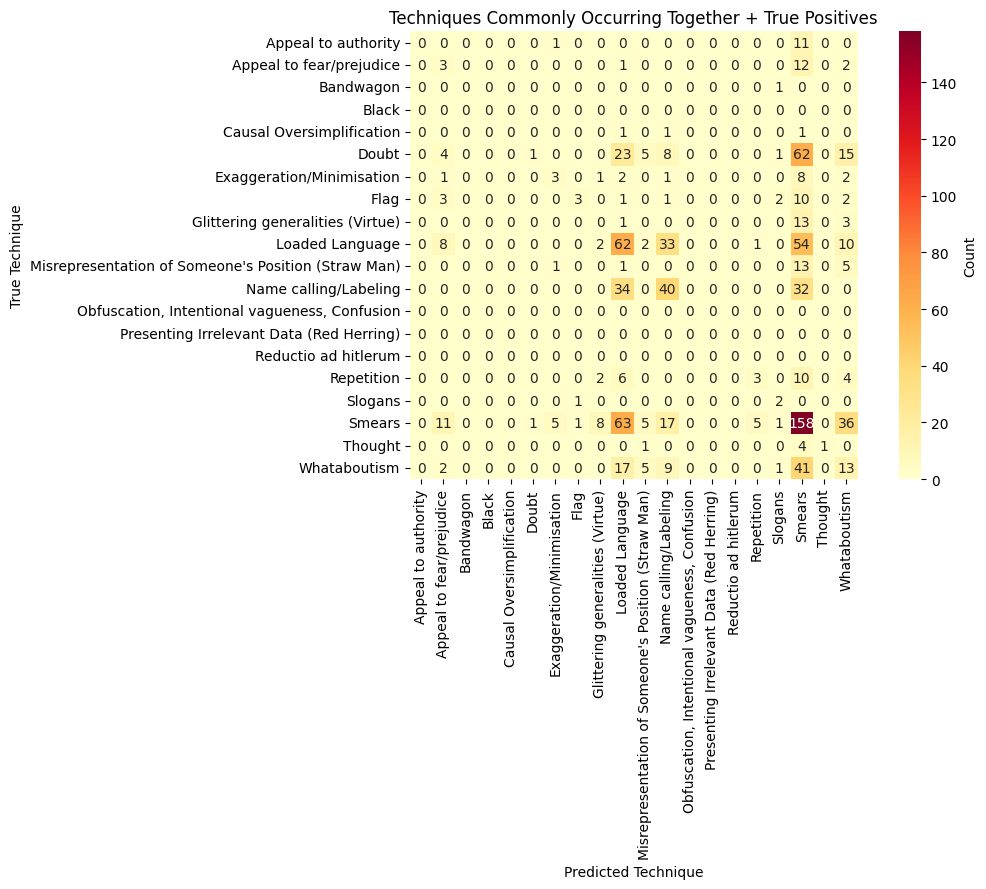


Most common co-occurrences (excluding true positives):
Smears (true) - Loaded Language (predicted): 63
Doubt (true) - Smears (predicted): 62
Loaded Language (true) - Smears (predicted): 54
Whataboutism (true) - Smears (predicted): 41
Smears (true) - Whataboutism (predicted): 36


In [105]:
def create_and_plot_cooccurrence_matrix(val_labels_tensor, val_predictions_binary, mlb):
    techniques = [class_name.split('-')[1] for class_name in mlb.classes_ if class_name != 'O']
    n_techniques = len(techniques)
    cooccurrence_matrix = np.zeros((n_techniques, n_techniques), dtype=int)

    # Debugging: Count total occurrences of each technique in true labels
    true_label_counts = np.zeros(n_techniques, dtype=int)

    # Iterate through each meme
    for meme_true, meme_pred in zip(val_labels_tensor, val_predictions_binary):
        # Iterate through each token in the meme
        for token_true, token_pred in zip(meme_true, meme_pred):
            true_techniques = np.where(token_true[:n_techniques] == 1)[0]
            pred_techniques = np.where(token_pred[:n_techniques] == 1)[0]

            # Debugging: Update true label counts
            true_label_counts += token_true[:n_techniques]

            # Update cooccurrence matrix
            for t in true_techniques:
                for p in pred_techniques:
                    cooccurrence_matrix[t, p] += 1

    # Create DataFrame
    cm_df = pd.DataFrame(cooccurrence_matrix, index=techniques, columns=techniques)

    # Create the heatmap
    plt.figure(figsize=(12, 9))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='YlOrRd', square=True, cbar_kws={'label': 'Count'})

    plt.title('Techniques Commonly Occurring Together + True Positives')
    plt.xlabel('Predicted Technique')
    plt.ylabel('True Technique')

    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    return cm_df

cooccurrence_df = create_and_plot_cooccurrence_matrix(val_labels_tensor, val_predictions_binary, mlb)

# Print most common co-occurrences
print("\nMost common co-occurrences (excluding true positives):")
co_occurrences = []
for i, tech1 in enumerate(cooccurrence_df.index):
    for j, tech2 in enumerate(cooccurrence_df.columns):
        if i != j:
            count = cooccurrence_df.loc[tech1, tech2]
            if count > 0:
                co_occurrences.append((tech1, tech2, count))

co_occurrences.sort(key=lambda x: x[2], reverse=True)

for tech1, tech2, count in co_occurrences[:5]:
    print(f"{tech1} (true) - {tech2} (predicted): {count}")

**Note that this is not a confusion matrix as this is a multi-label classification problem**

* "Smears" clearly had the most true positives (158) and its predictions also co-occurs with many other techniques, particularly  'Loaded Language' with 54 tokens with that label being predicted as "Smears" and 62 tokens predicted as "Smears" that were also labelled as "Loaded Language"

* Smears is a common co-occurance because Smears were typically assigned to every token in the meme text when it was assigned

* Next biggest co-occurance besides Smears is "Name calling/Labeling" vs "Loaded Language", which makes sense as Name calling can be done with loaded language

Let's identify some of these co-occurances and try to analyse any misclassifications

In [ ]:
id2tag

{0: 'I-Appeal to authority',
 1: 'I-Appeal to fear/prejudice',
 2: 'I-Bandwagon',
 3: 'I-Black-and-white Fallacy/Dictatorship',
 4: 'I-Causal Oversimplification',
 5: 'I-Doubt',
 6: 'I-Exaggeration/Minimisation',
 7: 'I-Flag-waving',
 8: 'I-Glittering generalities (Virtue)',
 9: 'I-Loaded Language',
 10: "I-Misrepresentation of Someone's Position (Straw Man)",
 11: 'I-Name calling/Labeling',
 12: 'I-Obfuscation, Intentional vagueness, Confusion',
 13: 'I-Presenting Irrelevant Data (Red Herring)',
 14: 'I-Reductio ad hitlerum',
 15: 'I-Repetition',
 16: 'I-Slogans',
 17: 'I-Smears',
 18: 'I-Thought-terminating cliché',
 19: 'I-Whataboutism',
 20: 'O'}

In [ ]:
import numpy as np

def identify_misclassified_memes(val_predictions_binary, val_labels_tensor):
    misclassifications = {
        'NCL_vs_LL': [],  # Name calling labelling vs Loaded langauge
        'D_vs_S': []    # Doubt vs Smears
    }

    for i in range(64):  # Loop through each meme
        # Name calling labelling
        ncl_true = np.any(val_labels_tensor[i, :, [11]])
        ncl_pred = np.any(val_predictions_binary[i, :, [11]])

        # Loaded langauge
        ll_true = np.any(val_labels_tensor[i, :, [9]])
        ll_pred = np.any(val_predictions_binary[i, :, [9]])

        # Doubt
        d_true = np.any(val_labels_tensor[i, :, [5]])
        d_pred = np.any(val_predictions_binary[i, :, [5]])

        # Smears
        s_true = np.any(val_labels_tensor[i, :, [17]])
        s_pred = np.any(val_predictions_binary[i, :, [17]])


        # Count misclassifications
        if ncl_true and not ncl_pred:
            if ll_true:
                misclassifications['NCL_vs_LL'].append((i, np.sum(val_predictions_binary[i, :, [9]])))
        if ll_true and not ll_pred:
            if ncl_true:
                misclassifications['NCL_vs_LL'].append((i, np.sum(val_predictions_binary[i, :, [11]])))
        if d_true and not d_pred:
            if s_true:
                misclassifications['D_vs_S'].append((i, np.sum(val_predictions_binary[i, :, [17]])))
        if s_true and not s_pred:
            if d_true:
                misclassifications['D_vs_S'].append((i, np.sum(val_predictions_binary[i, :, [5]])))

    # Sort misclassifications by count and get top 3
    for key in misclassifications:
        misclassifications[key] = sorted(misclassifications[key], key=lambda x: x[1], reverse=True)[:3]

    return misclassifications

misclassified = identify_misclassified_memes(val_predictions_binary, val_labels_tensor)

# Print results
for misclass_type, memes in misclassified.items():
    print(f"\nMisclassification type: {misclass_type}")
    for index, count in memes:
        print(f"Meme index: {index}, Misclassification count: {count}")


Misclassification type: NCL_vs_LL
Meme index: 43, Misclassification count: 13
Meme index: 59, Misclassification count: 6
Meme index: 6, Misclassification count: 2

Misclassification type: D_vs_S
Meme index: 14, Misclassification count: 44
Meme index: 53, Misclassification count: 41
Meme index: 58, Misclassification count: 14


We've found some memes with many relevant misclassifications, let's see if we can visualise the memes, predictions and labels in a way which allows us to analyse these misclassifications

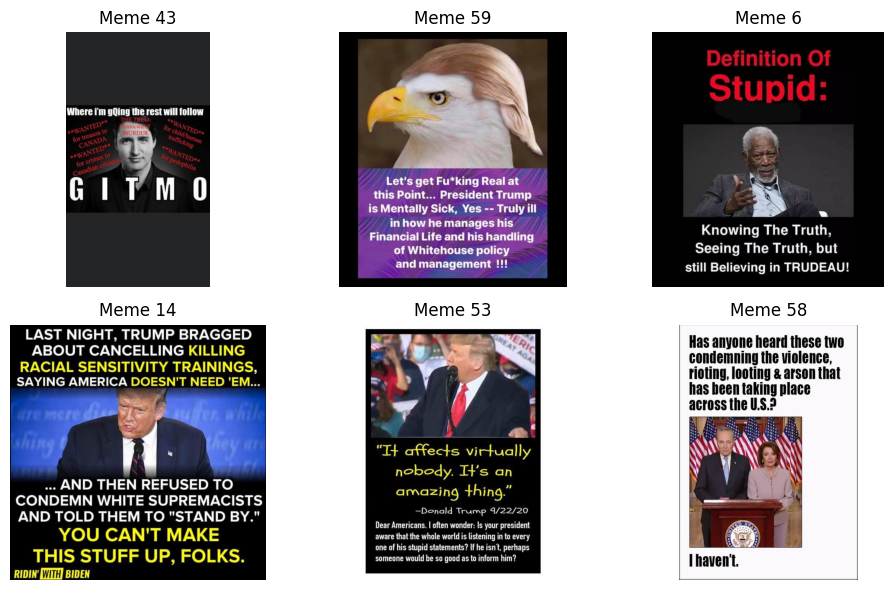

In [ ]:
#set indices as above
confused_meme_indices = [43, 59, 6, 14, 53, 58]

# retrieve image links
confused_meme_links = [val_images_link[i] for i in confused_meme_indices]

# Loop through the selected images and display them
fig, axs = plt.subplots(2, 3, figsize=(10, 6))
axs = axs.flatten()
for i, (ax, image_link) in enumerate(zip(axs, confused_meme_links)):

    img = Image.open(image_link)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Meme {confused_meme_indices[i]}')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np

def analyze_specific_meme(meme_index, val_predictions_binary, val_labels_tensor, val_full_text_token_lists, techniques):
    tokens = val_full_text_token_lists[meme_index]
    num_tokens = len(tokens)

    # Create empty DataFrame
    df = pd.DataFrame({
        'Token': tokens,
        'Pred_NLC': np.full(num_tokens, None),
        'True_NLC': np.full(num_tokens, None),
        'Pred_LL': np.full(num_tokens, None),
        'True_LL': np.full(num_tokens, None)
    })

    # Fill the DataFrame
    for token_idx in range(num_tokens):
        # Check predictions
        if val_predictions_binary[meme_index, token_idx, 9] == 1:
            df.at[token_idx, 'Pred_LL'] = 'Loaded language'
        if val_predictions_binary[meme_index, token_idx, 11] == 1:
            df.at[token_idx, 'Pred_NLC'] = "Name Calling / Labelling"

        # Check true labels
        if val_labels_tensor[meme_index, token_idx, 9] == 1:
            df.at[token_idx, 'True_LL'] = 'Loaded language'
        if val_labels_tensor[meme_index, token_idx, 11] == 1:
            df.at[token_idx, 'True_NLC'] = "Name Calling / Labelling"

    return df

# Usage
meme_index = 6
result_df_6 = analyze_specific_meme(6, val_predictions_binary, val_labels_tensor, val_full_text_token_lists, techniques)

# Display the DataFrame
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
#print first 35 rows of result_df
result_df_6.head(18)

,Token,Pred_NLC,True_NLC,Pred_LL,True_LL
0,▁definition,None,None,None,None
1,▁of,None,None,None,None
2,▁stupid,None,Name Calling / Labelling,None,Loaded language
3,:,None,None,None,None
4,▁knowing,None,None,None,None
5,▁the,None,None,None,None
6,▁truth,None,None,None,None
7,",",None,None,None,None
8,▁seeing,None,None,Loaded language,None
9,▁the,None,None,None,None


* It is not evident here that the model is grasping an understanding of the loaded language or name calling classes, with "seeing" and "trudeau" being labelled as loaded language despite them in no way relating to loaded language.

* This is a very challenging task we are asking the model to do, where even current events and knowing who particular people are in the images assists in deciphering which persuasion techniques are being used.

Evaluation summary:

* Performance is not great, but it is a very complex task and the model is achieving the goal of > 10% macro weighted F1 score, seems to be grasping an understanding of some of the text and images.

Let's check that it achieves similar performance on the test set

### Test Set Predictions and Evaluation

We will only predict for the best model and for the base model, just to see how much we improved performance via tuning the model.

In [89]:
#load base model from best_model.weights.h5
model = load_model()
model.load_weights('base_model.weights.h5')

#predict for test data
test_predictions = model.predict([test_images, test_input_ids, test_attention_mask],
                                verbose=0)

#convert predictions to binary (0 or 1)
test_predictions_binary = (test_predictions > 0.5).astype(int)

#flatten test predictions and validation labels
test_pred_flat = test_predictions_binary.reshape(-1, test_predictions_binary.shape[-1])
test_labels_flat = test_labels_tensor.reshape(-1, test_labels_tensor.shape[-1])

test_ner_metrics_df = create_ner_metrics_report(test_labels_flat, test_pred_flat, id2tag)

# Display the DataFrame
display(test_ner_metrics_df)

,Class Name,Precision,Recall,F1-Score,Support
0,I-Appeal to authority,0.2632,0.0595,0.0971,168
1,I-Appeal to fear/prejudice,0.1000,0.0066,0.0124,151
2,I-Bandwagon,0,0,0,29
3,I-Black-and-white Fallacy/Dictatorship,0,0,0,90
4,I-Causal Oversimplification,0,0,0,59
5,I-Doubt,0.5000,0.0105,0.0205,478
6,I-Exaggeration/Minimisation,0.4000,0.0235,0.0444,170
7,I-Flag-waving,0,0,0,60
8,I-Glittering generalities (Virtue),0,0,0,200
9,I-Loaded Language,0.6117,0.2329,0.3373,541


In [90]:
model = load_model()
model.load_weights('moderate_high_lr_model.weights.h5')

#predict for test data
test_predictions = model.predict([test_images, test_input_ids, test_attention_mask],
                                verbose=0)

#convert predictions to binary (0 or 1)
test_predictions_binary = (test_predictions > 0.5).astype(int)

#flatten test predictions and validation labels
test_pred_flat = test_predictions_binary.reshape(-1, test_predictions_binary.shape[-1])
test_labels_flat = test_labels_tensor.reshape(-1, test_labels_tensor.shape[-1])

test_ner_metrics_df = create_ner_metrics_report(test_labels_flat, test_pred_flat, id2tag)

# Display the DataFrame
display(test_ner_metrics_df)

,Class Name,Precision,Recall,F1-Score,Support
0,I-Appeal to authority,0.2581,0.0476,0.0804,168
1,I-Appeal to fear/prejudice,0.1268,0.0596,0.0811,151
2,I-Bandwagon,0,0,0,29
3,I-Black-and-white Fallacy/Dictatorship,0.2500,0.0222,0.0408,90
4,I-Causal Oversimplification,0,0,0,59
5,I-Doubt,0.3333,0.0209,0.0394,478
6,I-Exaggeration/Minimisation,0.4634,0.1118,0.1801,170
7,I-Flag-waving,0.2500,0.0333,0.0588,60
8,I-Glittering generalities (Virtue),0,0,0,200
9,I-Loaded Language,0.6282,0.2717,0.3794,541


We achieved significantly better performance through tuning the model with macro f1 improved from 59% to 8.5% and micro f1 improved from 19.4% to 22%. Our decision to select a model with better macro f1 performance rather than micro f1 was a good decision as we have not quite managed to meet the goal of 10% macro f1 score on the test set, but we have beat the micro f1 goal of 20%.

* Macro F1 is substantially poorer than on validation set, which would be expected as 6 classes with 0 support in the validation set were included in the test set, which will be the hardest classes for the model to predict for.

* Micro f1 is also worse at 22% vs 28% on the validation set.

* Model generalised OK

Remedy:

* Due to limitted computational resources we are selecting the best model based on one iteration of training, it would be far more ideal to use k-fold cross validation to see how models perform across 5 or more training runs on different subsets of the training data and validation data, to ensure a more robust model is selected.

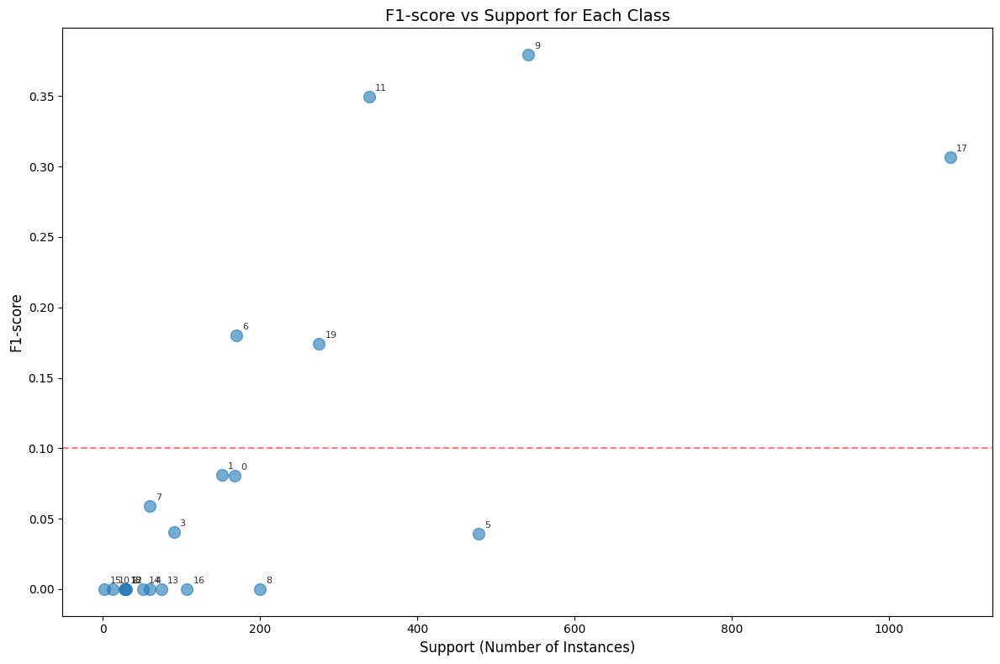

In [107]:
plot_f1_vs_support(test_ner_metrics_df)

This shows a definite trend with the least represented classes scoring 0 and the most represented classes lifting the average. Clearly the model has bias toward better classifying more highly supported persuasion techniques.

Main take away from test prediction analysis:
* Worse yet similar performance to the validation set, model generalised OK to unseen data.

Areas for improvement/further work (I would love to but this has consumed too many days amd hours already):

* Retrain on entire dataset
* Use RoBERTa - minimal computational requirement increase for more model capacity, and it has been pretrained on significantly more data and more relevant data to this task
* Fine tune text model on PTCSemEval20 dataset
* Implement attention based transformer fusion model
* Tune focal loss parameters
* Experiment with fully connected layers to add model complexity then also add more regularization
* Combine less supported techniques into 1 label

Limitations/Bias:

* Very poor prediction ability for persuasion techniques with low support in the training set

* Poor integration of text and image models limits the model's ability to classify text based on the images

* Tokenizer does not handle numbers very well

### Predictions on independently collected memes

In [94]:
# !rm -r ./data/images/new
!mkdir data/images/new
#copy images into image folder
!cp /content/drive/'My Drive'/DeepLearningAss2/datasets/New/* ./data/images/new

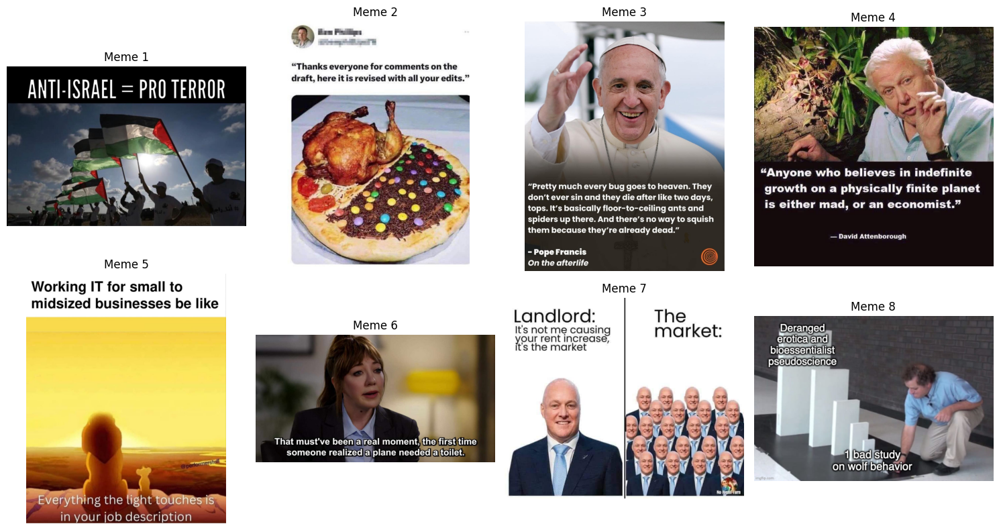

In [95]:
new_image_links = []
for x in range(0,8):
    new_image_links.append(f'/content/data/images/new/new_{x}.png')
new_images = [Image.open(link) for link in new_image_links]

# Loop through the images and display them
fig, axs = plt.subplots(2, 4, figsize=(15, 8))
axs = axs.flatten()
for i, (ax, img) in enumerate(zip(axs, new_images)):
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Meme {i+1}')
plt.tight_layout()
plt.show()

In [96]:
text_new = ["ANTI-ISRAEL = PRO TERROR",
            "'Thanks everyone for comments on the draft, here it is revised with all your edits.'",
            "'Pretty much every bug goes to heaven. They don't ever sin and they die after like two days, tops. It's basically floor-to-ceiling ants and spiders up there. And there's no way to squish them because they're already dead.'\n\n- Pope Francis\nOn the afterlife",
            "'Anyone who believes in indefinite growth on a physically finite planet is either mad, or an economist.'\n\n- David Attenborough",
            "Working IT for small to midsized businesses be like\n\nEverything the light touched is in your job description",
            "That must've been a real moment, the first time someone realised a plane needed a toilet.",
            "Landlord:\nIt's not me causing your rent increase, it's the market\n\nThe market:",
            "Deranged erotica and bioessentialist pseudoscience\n\n1 bad study on wolf behavior"]

In [97]:
images_new_preprocessed = []
for img in new_images:
    img = img.resize((224, 224))
    img = img.convert('RGB')
    # Convert image to NumPy array and normalize
    img = np.array(img) / 255.0
    # add to list of images
    images_new_preprocessed.append(img)

In [98]:
new_input_ids = []
for text in text_new:
    tokenize = tokenizer(text)
    new_input_ids.append(tokenize['input_ids'])
lengths = [len(seq) for seq in new_input_ids]
print(f"Min length: {min(lengths)}, Max length: {max(lengths)}")

Min length: 8, Max length: 73


In [99]:
new_max_length = 99

new_input_ids = []
new_attention_masks = []
new_text_tokens_list = []

for text in text_new:
    tokenize = tokenizer(text, padding='max_length', truncation=True, max_length=new_max_length)
    new_text_tokens_list.append(tokenizer.convert_ids_to_tokens(tokenize['input_ids']))
    new_input_ids.append(tokenize['input_ids'])
    new_attention_masks.append(tokenize['attention_mask'])

images_new_preprocessed_array = np.array(images_new_preprocessed)
new_input_ids = np.array(new_input_ids)
new_attention_masks = np.array(new_attention_masks)
print(new_input_ids.shape)
print(new_attention_masks.shape)
print(images_new_preprocessed_array.shape)

(8, 99)
(8, 99)
(8, 224, 224, 3)


In [100]:
new_predictions = model.predict([images_new_preprocessed_array, new_input_ids, new_attention_masks])
new_predictions_binary = (new_predictions > 0.5).astype(int)

1/1 [==============================] - 0s 49ms/step


In [101]:
meme_dataframes = []
categories = 21

for meme_idx in range(7):
    tokens = new_text_tokens_list[meme_idx]  # List of tokens for the current meme (101 tokens)
    predictions = new_predictions_binary[meme_idx]  # Predictions for the current meme (shape: 101 x 41)

    # Initialize an empty DataFrame with a column for each technique + token column
    df = pd.DataFrame(columns=['Token'] + list(range(1, categories + 1)))

    # Populate the DataFrame
    for token_idx in range(99):  # Loop over each token
        row = [tokens[token_idx]]  # Start row with the token
        # Add None for all technique columns initially
        row.extend([None] * categories)

        for category_idx in range(21):  # Loop over each category (0-20)
            if predictions[token_idx, category_idx] == 1:
                if category_idx == 20:
                    row[21] = 'No technique'  # Category 20 corresponds to 'No technique'
                else:
                    technique_name = techniques[category_idx % 20]  # Get the corresponding technique
                    row[category_idx % 20 + 1] = technique_name  # Fill the appropriate column (1-20)

        df.loc[token_idx] = row  # Add the row to the DataFrame

    # Append the DataFrame to the list
    meme_dataframes.append(df)

In [102]:
meme_dataframes[0].head(8)

,Token,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21
0,[CLS],None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,No technique
1,▁anti,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,-,None,None,None,None,None,None,None,None,None,None,None,"Obfuscation, Intentional vagueness, Confusion",None,None,None,None,None,None,None,None,None
3,israel,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,▁=,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
5,▁pro,None,None,None,None,None,None,None,None,None,None,None,"Obfuscation, Intentional vagueness, Confusion",None,None,None,None,None,None,None,None,None
6,▁terror,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
7,[SEP],None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,No technique


You can see here that the model identifies the word pro as related to both 'Obfuscation, Intentional vagueness, Confusion' which could be considered accurate.